- Projeto sobre a análise dos dados de testes rápido de COVID-19, com o uso de machine learning.
- Esté o código do grupo LIFE-DATA, do Instituto D'vinci3, dados disponibilizados pelo Instituto Butantan.
- Alguns testes foram feitos de maneira "manual", porém, após uma discussão, optamos por uma função, para agilizar a análise da equipe de cientistas de dados do Instituto Butantan para se ter um melhor entendimentoo do tema.
- O código passou por algumas modificações desde a apresentação do dia 12/01/2022, trazendo novos resultados e novas interpretações tendo fim como aprimoramento do resultado.
- É necessário rodar todos os passos na ordem apresentada.

# Import

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np
import scikitplot as skplt

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import precision_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import PrecisionRecallDisplay
from sklearn.model_selection import train_test_split
from collections import Counter
from sklearn.feature_extraction.text import TfidfVectorizer
from numpy import argmax

# Dataset

In [2]:
df = pd.read_csv(r"C:\Users\erick\OneDrive\Documentos\GitHub\data-science\Preprocessing\Balancing\data_set02_origin.csv", sep=';')
df.drop('id', axis=1, inplace=True)
df.columns

Index(['result_igm', 'age_category', 'sex', 'conjunctivitis.x',
       'asymptomatic.x', 'abdomen_pain.x', 'chills.x', 'diarrhea.x',
       'missing_smell.x', 'missing_tasty.x', 'nausea.x', 'body_pain.x',
       'cough.x', 'fever.x', 'hard_breathe.x', 'head_pain.x', 'running_nose.x',
       'throat_pain.x', 'conjunctivitis.y', 'asymptomatic.y', 'abdomen_pain.y',
       'chills.y', 'diarrhea.y', 'missing_smell.y', 'missing_tasty.y',
       'nausea.y', 'body_pain.y', 'cough.y', 'fever.y', 'hard_breathe.y',
       'head_pain.y', 'running_nose.y', 'throat_pain.y'],
      dtype='object')

In [3]:
df1 = pd.read_csv(r"C:\Users\erick\OneDrive\Documentos\GitHub\data-science\Preprocessing\Balancing\data_set02_origin.csv", sep=';')
df1.drop('id', axis=1, inplace=True)
df1.drop('result_igm', axis=1, inplace=True)

In [4]:
df.drop(['conjunctivitis.y', 'asymptomatic.y', 'abdomen_pain.y',
        'chills.y', 'diarrhea.y', 'missing_smell.y', 'missing_tasty.y',
        'nausea.y', 'body_pain.y', 'cough.y', 'fever.y', 'hard_breathe.y',
        'head_pain.y', 'running_nose.y', 'throat_pain.y'], axis=1, inplace=True)

In [5]:
df.columns

Index(['result_igm', 'age_category', 'sex', 'conjunctivitis.x',
       'asymptomatic.x', 'abdomen_pain.x', 'chills.x', 'diarrhea.x',
       'missing_smell.x', 'missing_tasty.x', 'nausea.x', 'body_pain.x',
       'cough.x', 'fever.x', 'hard_breathe.x', 'head_pain.x', 'running_nose.x',
       'throat_pain.x'],
      dtype='object')

In [6]:
df1.drop(['conjunctivitis.y', 'asymptomatic.y', 'abdomen_pain.y',
        'chills.y', 'diarrhea.y', 'missing_smell.y', 'missing_tasty.y',
        'nausea.y', 'body_pain.y', 'cough.y', 'fever.y', 'hard_breathe.y',
        'head_pain.y', 'running_nose.y', 'throat_pain.y'], axis=1, inplace=True)

In [7]:
df1.columns

Index(['age_category', 'sex', 'conjunctivitis.x', 'asymptomatic.x',
       'abdomen_pain.x', 'chills.x', 'diarrhea.x', 'missing_smell.x',
       'missing_tasty.x', 'nausea.x', 'body_pain.x', 'cough.x', 'fever.x',
       'hard_breathe.x', 'head_pain.x', 'running_nose.x', 'throat_pain.x'],
      dtype='object')

In [8]:
df.collumns= df1.columns

C:\Users\erick\AppData\Local\Temp/ipykernel_2076/3071881145.py:1: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  df.collumns= df1.columns


In [9]:
df['result_igm'].value_counts()

0    1120640
1      71657
Name: result_igm, dtype: int64

# Scaler e definição de variáveis

In [10]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled_X = scaler.fit_transform(df1)

In [11]:
X = scaled_X

In [12]:
X

array([[ 0.23978292,  0.92985043, -0.16075126, ..., -0.41223853,
        -0.33398575, -0.34757665],
       [-1.59855278,  0.92985043, -0.16075126, ..., -0.41223853,
        -0.33398575, -0.34757665],
       [ 0.23978292, -1.07544177, -0.16075126, ..., -0.41223853,
        -0.33398575, -0.34757665],
       ...,
       [-0.98577422, -1.07544177, -0.16075126, ..., -0.41223853,
        -0.33398575, -0.34757665],
       [ 0.23978292,  0.92985043, -0.16075126, ..., -0.41223853,
        -0.33398575, -0.34757665],
       [ 0.85256148, -1.07544177, -0.16075126, ..., -0.41223853,
        -0.33398575, -0.34757665]])

In [13]:
y = df['result_igm']

# Random Forest (Manual)

In [14]:
from sklearn.ensemble import RandomForestClassifier
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=100)
print(f"Estatísticas do target y: {Counter(y_train)}")
print(f"Estatísticas do target X: {Counter(y_test)}")

Estatísticas do target y: Counter({0: 784451, 1: 50156})
Estatísticas do target X: Counter({0: 336189, 1: 21501})


In [15]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33)

In [16]:
n= Counter(y_train)
ratio = int(n[0]/n[1])
ratio, n

(15, Counter({0: 750812, 1: 48026}))

In [17]:
rfc = RandomForestClassifier(criterion='entropy')
rfc.fit(X_train, y_train)

RandomForestClassifier(criterion='entropy')

In [18]:
y_pred = rfc.predict(X_test)

In [19]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.94      1.00      0.97    369828
           1       0.16      0.01      0.01     23631

    accuracy                           0.94    393459
   macro avg       0.55      0.50      0.49    393459
weighted avg       0.89      0.94      0.91    393459



In [20]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score


In [21]:
print(confusion_matrix(y_test, y_pred))

[[368992    836]
 [ 23469    162]]


In [22]:
a_s = accuracy_score(y_test, y_pred)
print(a_s)

0.9382273629526837


In [23]:
f1 = f1_score(y_test, y_pred)
print(f1)

0.013155223516992165


In [24]:
y_score = rfc.predict_proba(X_test)
print(y_score)

[[0.92832869 0.07167131]
 [0.95871842 0.04128158]
 [0.92303216 0.07696784]
 ...
 [0.95491323 0.04508677]
 [0.9359417  0.0640583 ]
 [0.95871842 0.04128158]]


In [25]:
fpr0, tpr0, thresholds = roc_curve(y_test, y_score[:, 1])

In [26]:
roc_auc0 = auc(fpr0, tpr0)

In [27]:
thresholds

array([2.00000000e+00, 1.00000000e+00, 9.70000000e-01, ...,
       8.77192982e-05, 6.94444444e-05, 0.00000000e+00])

Youden's J statistic
- https://en.wikipedia.org/wiki/Youden%27s_J_statistic

In [28]:
J = tpr0 - fpr0
print(J)



[ 0.          0.00011884  0.00010802 ... -0.00152113 -0.00152653
  0.        ]


In [29]:
ix = argmax(J)
print(ix)

6405


In [30]:
cm1 = (confusion_matrix(y_test, y_pred))

In [31]:
cm1

array([[368992,    836],
       [ 23469,    162]], dtype=int64)

In [32]:
cm1[0,0]


368992

In [33]:
cm1[1,1]

162

In [34]:
cm1[0,1]

836

In [35]:
cm1[1,0]

23469

In [36]:
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])

In [37]:
y_score1 = np.array([[1, y[1]] if y[0] >= ix else [0, y[1]] for y in y_score])
print(y_score1)

[[0.         0.07167131]
 [0.         0.04128158]
 [0.         0.07696784]
 ...
 [0.         0.04508677]
 [0.         0.0640583 ]
 [0.         0.04128158]]


# Resultado Random Forest

In [38]:
print('A matriz de classificação: %s' % (classification_report(y_test, y_pred)) )
print('A matriz de confusão: %s' % (confusion_matrix(y_test, y_pred)) )
print('A acurácia do modelo: %s' % accuracy_score(y_test, y_pred) )
print('Valor do F1-score: %s' % f1_score(y_test, y_pred) )
print('Valor da sensibilidade: %s' % sensi)
print('Valor da especificação: %s' % speci)


A matriz de classificação:               precision    recall  f1-score   support

           0       0.94      1.00      0.97    369828
           1       0.16      0.01      0.01     23631

    accuracy                           0.94    393459
   macro avg       0.55      0.50      0.49    393459
weighted avg       0.89      0.94      0.91    393459

A matriz de confusão: [[368992    836]
 [ 23469    162]]
A acurácia do modelo: 0.9382273629526837
Valor do F1-score: 0.013155223516992165
Valor da sensibilidade: 0.00685540180271677
Valor da especificação: 0.9977394897087295


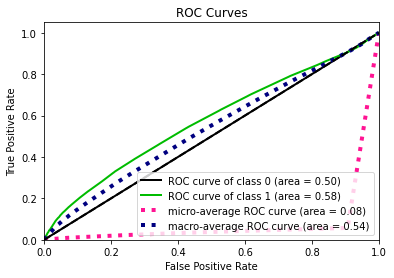

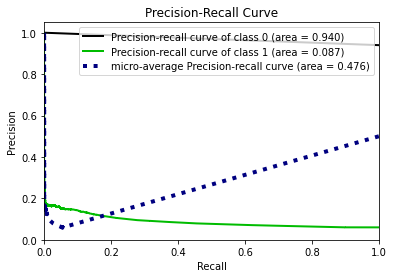

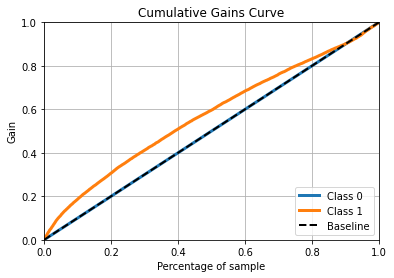

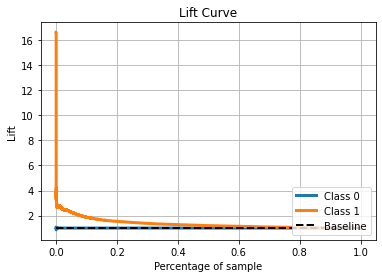

In [39]:
from scikitplot.metrics import plot_roc
from scikitplot.metrics import plot_precision_recall
from scikitplot.metrics import plot_cumulative_gain
from scikitplot.metrics import plot_lift_curve
plot_roc(y_test, y_score1)
plt.show()
    
plot_precision_recall(y_test, y_score1)
plt.show()
    
plot_cumulative_gain(y_test, y_score1)
plt.show()
    
plot_lift_curve(y_test, y_score1)
plt.show()

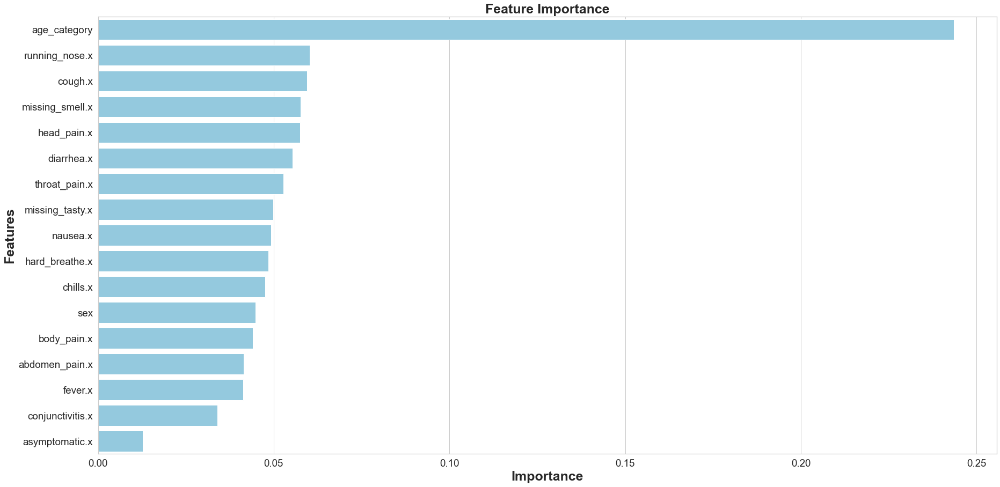

None

,Features,Gini-Importance
0,age_category,0.243512
1,running_nose.x,0.060267
2,cough.x,0.059444
3,missing_smell.x,0.057704
4,head_pain.x,0.057527
5,diarrhea.x,0.055318
6,throat_pain.x,0.052733
7,missing_tasty.x,0.049928
8,nausea.x,0.049309
9,hard_breathe.x,0.048553


In [40]:
feats = {}
for feature, importance in zip(df1.columns, rfc.feature_importances_):
    feats[feature] = importance
importances = pd.DataFrame.from_dict(feats, orient='index').rename(columns={0: 'Gini-Importance'})
importances = importances.sort_values(by='Gini-Importance', ascending=False)
importances = importances.reset_index()
importances = importances.rename(columns={'index': 'Features'})
sns.set(font_scale = 5)
sns.set(style="whitegrid", color_codes=True, font_scale = 1.7)
fig, ax = plt.subplots()
fig.set_size_inches(30,15)
sns.barplot(x=importances['Gini-Importance'], y=importances['Features'], data=importances, color='skyblue')
plt.xlabel('Importance', fontsize=25, weight = 'bold')
plt.ylabel('Features', fontsize=25, weight = 'bold')
plt.title('Feature Importance', fontsize=25, weight = 'bold')
display(plt.show())
display(importances)

# Random Forest (Manual)
- (Random Over Sampler)

In [41]:
pip install imblearn

Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'C:\Users\erick\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip' command.


In [42]:
from imblearn.over_sampling import RandomOverSampler
over_sampler = RandomOverSampler(sampling_strategy = 'minority', random_state=42)
X_res, y_res = over_sampler.fit_resample(X_train, y_train)

In [43]:
rfc = RandomForestClassifier(criterion='entropy')
rfc.fit(X_res, y_res)

RandomForestClassifier(criterion='entropy')

In [44]:
y_pred = rfc.predict(X_test)

In [45]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.95      0.74      0.83    369828
           1       0.08      0.36      0.13     23631

    accuracy                           0.72    393459
   macro avg       0.51      0.55      0.48    393459
weighted avg       0.90      0.72      0.79    393459



In [46]:
print(confusion_matrix(y_test, y_pred))

[[274513  95315]
 [ 15173   8458]]


In [47]:
a_s = accuracy_score(y_test, y_pred)
print(a_s)

0.7191880221319121


In [48]:
f1 = f1_score(y_test, y_pred)
print(f1)

0.132774481177985


In [49]:
y_score = rfc.predict_proba(X_test)
print(y_score)

[[0.45356912 0.54643088]
 [0.59909425 0.40090575]
 [0.43752487 0.56247513]
 ...
 [0.57526869 0.42473131]
 [0.42739628 0.57260372]
 [0.59909425 0.40090575]]


In [50]:
fpr0, tpr0, thresholds = roc_curve(y_test, y_score[:, 1])

In [51]:
roc_auc0 = auc(fpr0, tpr0)

In [52]:
thresholds

array([2.00000000e+00, 1.00000000e+00, 9.89056508e-01, ...,
       1.36363636e-03, 8.33333333e-04, 0.00000000e+00])

Youden's J statistic
- https://en.wikipedia.org/wiki/Youden%27s_J_statistic

In [53]:
J = tpr0 - fpr0
print(J)

[ 0.          0.00301387  0.00304807 ... -0.00133481 -0.00134022
  0.        ]


In [54]:
ix = argmax(J)
print(ix)

4043


In [55]:
y_score1 = np.array([[1, y[1]] if y[0] >= ix else [0, y[1]] for y in y_score])
print(y_score1)

[[0.         0.54643088]
 [0.         0.40090575]
 [0.         0.56247513]
 ...
 [0.         0.42473131]
 [0.         0.57260372]
 [0.         0.40090575]]


In [56]:
from imblearn.over_sampling import RandomOverSampler
over_sampler = RandomOverSampler(random_state=42)
X_res, y_res = over_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 750812, 1: 750812})
Testing target statistics: Counter({0: 369828, 1: 23631})


In [57]:
#roc_auc_ros,fpr_ros,tpr_ros, _ = build_and_test(X_res, X_test, y_res, y_test)

In [58]:
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])

# Resultado Random Forest 
- (Random OverSample)

In [59]:
print('A matriz de classificação: %s' % (classification_report(y_test, y_pred)) )
print('A matriz de confusão: %s' % (confusion_matrix(y_test, y_pred)) )
print('A acurácia do modelo: %s' % accuracy_score(y_test, y_pred) )
print('Valor do F1-score: %s' % f1_score(y_test, y_pred) )
print('Valor da sensibilidade: %s' % sensi)
print('Valor da especificação: %s' % speci)

A matriz de classificação:               precision    recall  f1-score   support

           0       0.95      0.74      0.83    369828
           1       0.08      0.36      0.13     23631

    accuracy                           0.72    393459
   macro avg       0.51      0.55      0.48    393459
weighted avg       0.90      0.72      0.79    393459

A matriz de confusão: [[274513  95315]
 [ 15173   8458]]
A acurácia do modelo: 0.7191880221319121
Valor do F1-score: 0.132774481177985
Valor da sensibilidade: 0.00685540180271677
Valor da especificação: 0.9977394897087295


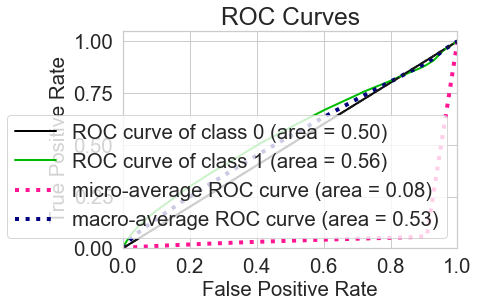

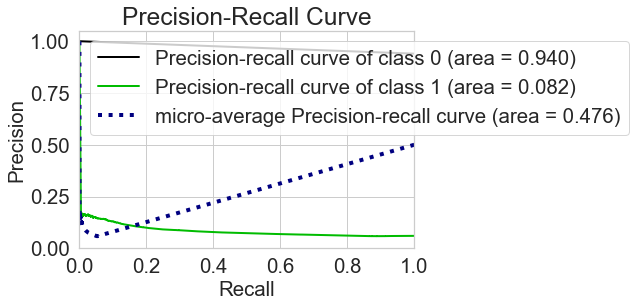

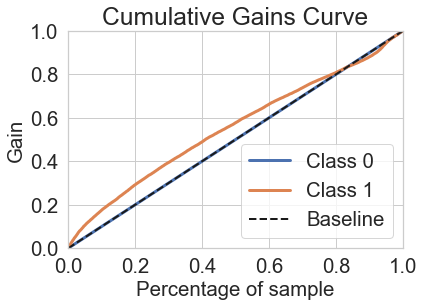

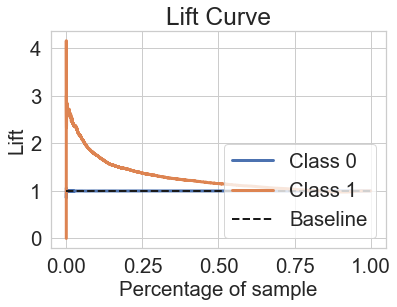

In [60]:
plot_roc(y_test, y_score1)
plt.show()
    
plot_precision_recall(y_test, y_score1)
plt.show()
    
plot_cumulative_gain(y_test, y_score1)
plt.show()
    
plot_lift_curve(y_test, y_score1)
plt.show()

# Random Forest (Manual)
- Smote

In [61]:
from imblearn.over_sampling import SMOTE
over_sampler = SMOTE(k_neighbors=2)
X_res, y_res = over_sampler.fit_resample(X_train, y_train)

In [62]:
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size=0.3, random_state=100)
print(f"Estatistica de treinamento do target X: {Counter(y_train)}")
print(f"Estatistica de treinamento do target y: {Counter(y_test)}")

Estatistica de treinamento do target X: Counter({1: 526008, 0: 525128})
Estatistica de treinamento do target y: Counter({0: 225684, 1: 224804})


In [63]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33)

In [64]:
rfc = RandomForestClassifier(criterion='entropy')
rfc.fit(X_train, y_train)

RandomForestClassifier(criterion='entropy')

In [65]:
y_pred = rfc.predict(X_test)

In [66]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.94      1.00      0.97    369946
           1       0.18      0.01      0.01     23513

    accuracy                           0.94    393459
   macro avg       0.56      0.50      0.49    393459
weighted avg       0.89      0.94      0.91    393459



In [67]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score


In [68]:
print(confusion_matrix(y_test, y_pred))

[[369140    806]
 [ 23338    175]]


In [69]:
a_s = accuracy_score(y_test, y_pred)
print(a_s)

0.9386365542534292


In [70]:
f1 = f1_score(y_test, y_pred)
print(f1)

0.014289213684984077


In [71]:
y_score = rfc.predict_proba(X_test)
print(y_score)

[[9.48828536e-01 5.11714642e-02]
 [9.37101143e-01 6.28988566e-02]
 [9.37474948e-01 6.25250521e-02]
 ...
 [9.55323613e-01 4.46763866e-02]
 [9.37434507e-01 6.25654931e-02]
 [9.99807692e-01 1.92307692e-04]]


In [72]:
fpr0, tpr0, thresholds = roc_curve(y_test, y_score[:, 1])

In [73]:
roc_auc0 = auc(fpr0, tpr0)

In [74]:
thresholds

array([1.93185714e+00, 9.31857143e-01, 9.30634921e-01, ...,
       1.25000000e-04, 9.90099010e-05, 0.00000000e+00])

Youden's J statistic
- https://en.wikipedia.org/wiki/Youden%27s_J_statistic

In [75]:
J = tpr0 - fpr0
print(J)



[ 0.00000000e+00  4.25296644e-05  3.71234700e-05 ... -5.55273280e-04
 -5.15446712e-04  0.00000000e+00]


In [76]:
ix = argmax(J)
print(ix)

6390


In [77]:
y_score1 = np.array([[1, y[1]] if y[0] >= ix else [0, y[1]] for y in y_score])
print(y_score1)

[[0.         0.05117146]
 [0.         0.06289886]
 [0.         0.06252505]
 ...
 [0.         0.04467639]
 [0.         0.06256549]
 [0.         0.00019231]]


# Resultado Random Forest
 - Smote

In [78]:
print('A matriz de classificação: %s' % (classification_report(y_test, y_pred)) )
print('A matriz de confusão: %s' % (confusion_matrix(y_test, y_pred)) )
print('A acurácia do modelo: %s' % accuracy_score(y_test, y_pred) )
print('Valor do F1-score: %s' % f1_score(y_test, y_pred) )
print('Valor da sensibilidade: %s' % sensi)
print('Valor da especificação: %s' % speci)


A matriz de classificação:               precision    recall  f1-score   support

           0       0.94      1.00      0.97    369946
           1       0.18      0.01      0.01     23513

    accuracy                           0.94    393459
   macro avg       0.56      0.50      0.49    393459
weighted avg       0.89      0.94      0.91    393459

A matriz de confusão: [[369140    806]
 [ 23338    175]]
A acurácia do modelo: 0.9386365542534292
Valor do F1-score: 0.014289213684984077
Valor da sensibilidade: 0.00685540180271677
Valor da especificação: 0.9977394897087295


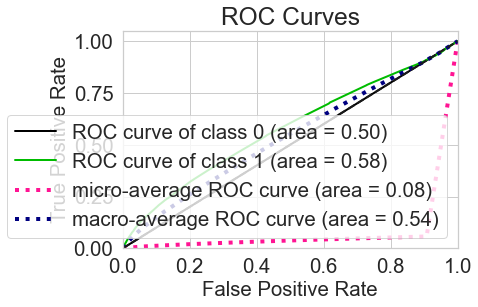

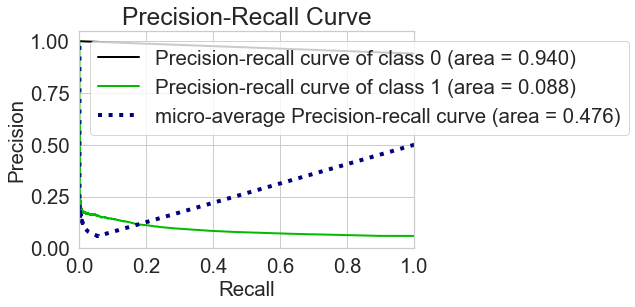

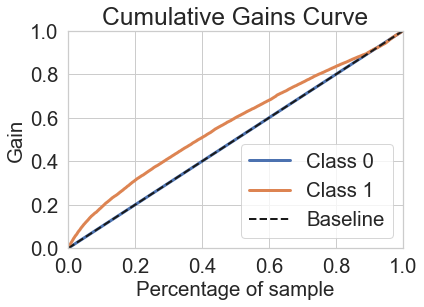

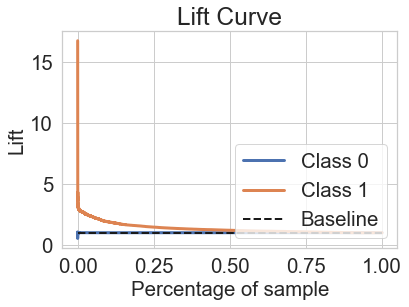

In [79]:
plot_roc(y_test, y_score1)
plt.show()
    
plot_precision_recall(y_test, y_score1)
plt.show()
    
plot_cumulative_gain(y_test, y_score1)
plt.show()
    
plot_lift_curve(y_test, y_score1)
plt.show()

# PCA

In [80]:
from sklearn.decomposition import PCA

In [81]:
pca = PCA(n_components=15)
pca_df = pca.fit_transform(scaled_X)
variancia = round(sum(pca.explained_variance_ratio_), 2)

In [82]:
y = df.result_igm
type(y)

pandas.core.series.Series

In [83]:
pca_df[:,:9].shape

(1192297, 9)

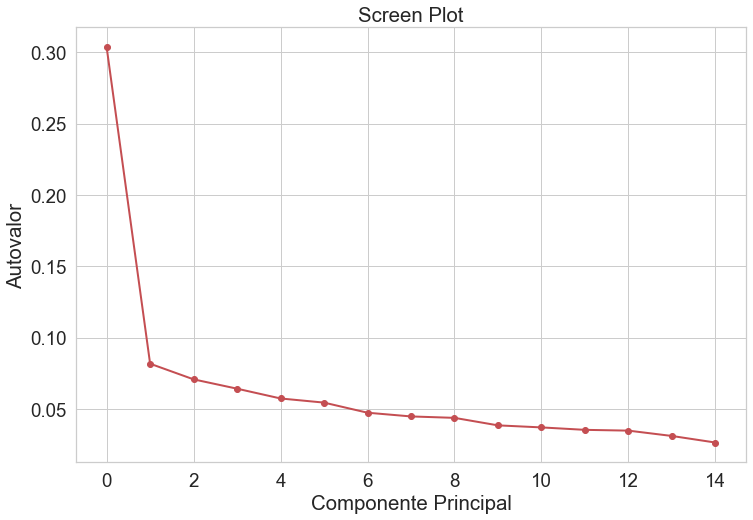

In [84]:
import numpy as np
fig = plt.figure(figsize=(12,8))

plt.plot(pca.explained_variance_ratio_,  'ro-', linewidth=2)
plt.title('Screen Plot')
plt.xlabel('Componente Principal')
plt.ylabel('Autovalor')

plt.show()

# Random Forest DEF ✅

In [85]:

import scikitplot as skplt
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve, auc, roc_auc_score

import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import PrecisionRecallDisplay
from numpy import argmax
import numpy as np

def build_and_test(X_tr, X_te, y_tr, y_te, class_weight=None, threshold=False):
    
    # Construindo PCA
    pca = PCA(n_components=15)
    pca.fit(X_tr.tolist())
    X_pca = pca.transform(X_tr.tolist())

    plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_tr, cmap=plt.cm.prism, edgecolor='k', alpha=0.7)
    plt.show()
    
    # Construindo Modelo
    if class_weight:
        model = RandomForestClassifier(class_weight = class_weight , criterion='entropy')
    else:
        model = RandomForestClassifier(criterion='entropy')
    model.fit(X_tr, y_tr)
    
    # Teste do modelo
    y_pred = model.predict(X_te)
    print('Resultado da prescisão %s' % precision_score(y_te, y_pred))
    print('Resultado do recall %s' % recall_score(y_te, y_pred))
    print('Resultado F1 %s' % f1_score(y_te, y_pred))
    print('Resultado acurácia %s' % accuracy_score(y_te, y_pred))
    
    y_score = model.predict_proba(X_te)
    fpr0, tpr0, thresholds = roc_curve(y_te, y_score[:, 1])
    roc_auc0 = auc(fpr0, tpr0)
    cm1 = confusion_matrix(y_test, y_pred)
    total1 = sum(sum(cm1))
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    print('Sensibilidade:  %s' % sensi)
    print('Especificação:  %s' % speci)
    # Calculando o melhor threashold
    best_threshold = None
    if threshold:
        J = tpr0 - fpr0
        ix = argmax(J) # valor da maior estatística 
        best_threshold = thresholds[ix]
        # ajuste de acordo com o threshold.
        y_score = np.array([[1, y[1]] if y[0] >= best_threshold else [0, y[1]] for y in y_score])
        
    # Plot 
    plot_roc(y_te, y_score)
    plt.show()
    
    plot_precision_recall(y_te, y_score1)
    plt.show()
    
    plot_cumulative_gain(y_te, y_score1)
    plt.show()
    
    plot_lift_curve(y_te, y_score)
    plt.show()
    
    # Print
    print(classification_report(y_te,y_pred))
    print(confusion_matrix(y_test, y_pred))
    return roc_auc0,fpr0,tpr0, best_threshold

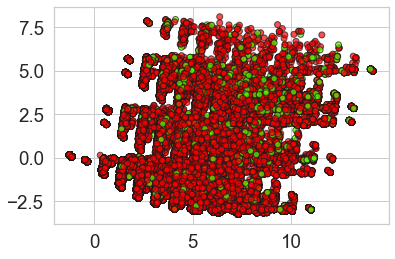

Resultado da prescisão 0.17743490838958534
Resultado do recall 0.00782545825713435
Resultado F1 0.014989816700610998
Resultado acurácia 0.9385399749402098
Sensibilidade:  0.00782545825713435
Especificação:  0.9976942580809091


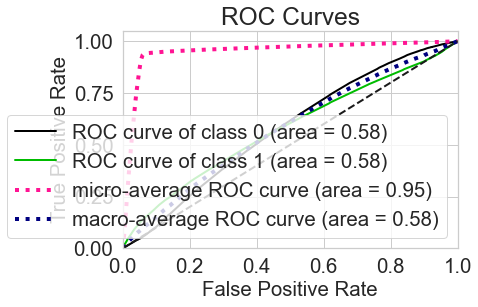

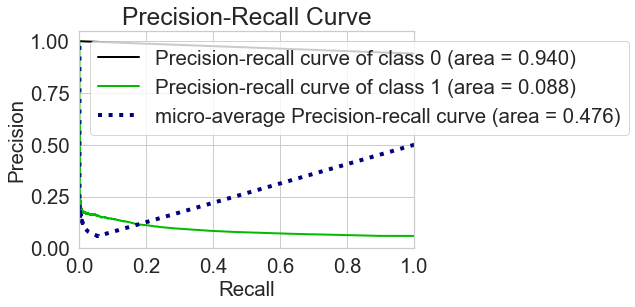

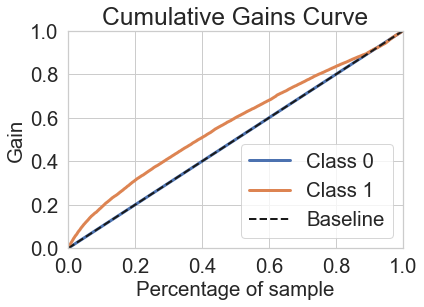

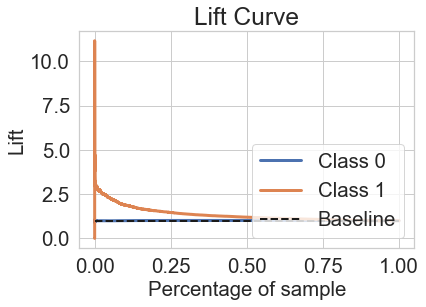

              precision    recall  f1-score   support

           0       0.94      1.00      0.97    369946
           1       0.18      0.01      0.01     23513

    accuracy                           0.94    393459
   macro avg       0.56      0.50      0.49    393459
weighted avg       0.89      0.94      0.91    393459

[[369093    853]
 [ 23329    184]]


In [86]:
roc_auc_imb,fpr_imb,tpr_imb, _ = build_and_test(X_train, X_test, y_train, y_test)

- Oversample

In [87]:
from imblearn.over_sampling import RandomOverSampler
over_sampler = RandomOverSampler(random_state=42)
X_res, y_res = over_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 750694, 1: 750694})
Testing target statistics: Counter({0: 369946, 1: 23513})


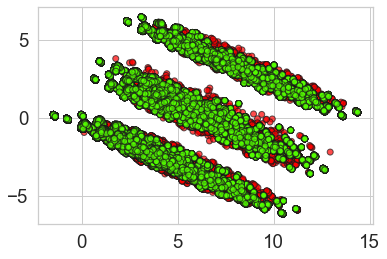

Resultado da prescisão 0.0821315820243988
Resultado do recall 0.358482541572747
Resultado F1 0.13364409668545515
Resultado acurácia 0.7222506029853174
Sensibilidade:  0.358482541572747
Especificação:  0.7453709460299611


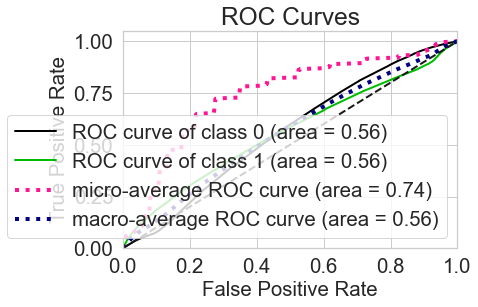

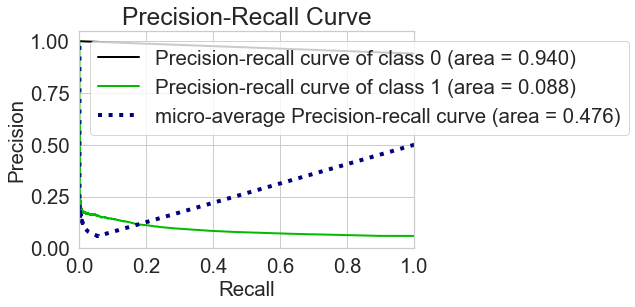

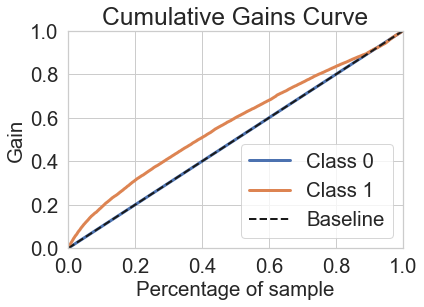

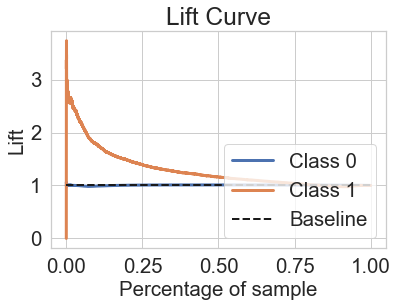

              precision    recall  f1-score   support

           0       0.95      0.75      0.83    369946
           1       0.08      0.36      0.13     23513

    accuracy                           0.72    393459
   macro avg       0.52      0.55      0.48    393459
weighted avg       0.90      0.72      0.79    393459

[[275747  94199]
 [ 15084   8429]]


In [88]:
roc_auc_ros,fpr_ros,tpr_ros, _ = build_and_test(X_res, X_test, y_res, y_test)

- SMOTE

In [89]:
from imblearn.over_sampling import SMOTE
over_sampler = SMOTE(k_neighbors=2)
X_res, y_res = over_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 750694, 1: 750694})
Testing target statistics: Counter({0: 369946, 1: 23513})


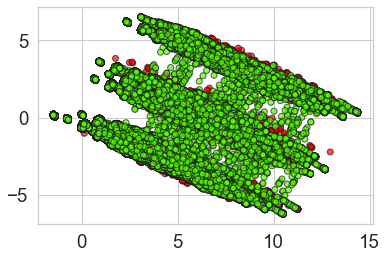

Resultado da prescisão 0.0814676286512735
Resultado do recall 0.3260749372687449
Resultado F1 0.1303645514520846
Resultado acurácia 0.740023738178565
Sensibilidade:  0.3260749372687449
Especificação:  0.7663334648840642


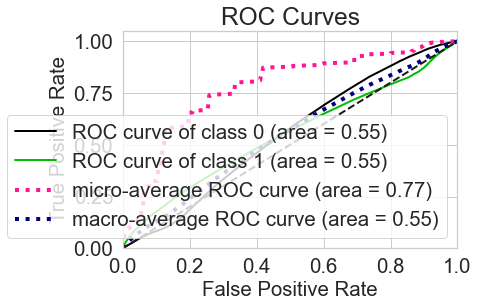

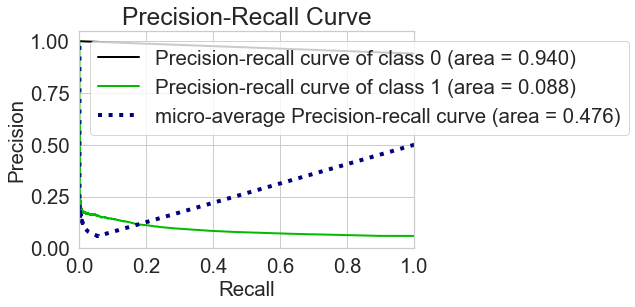

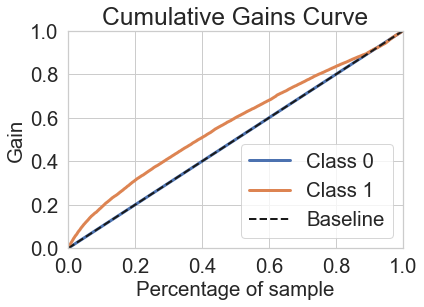

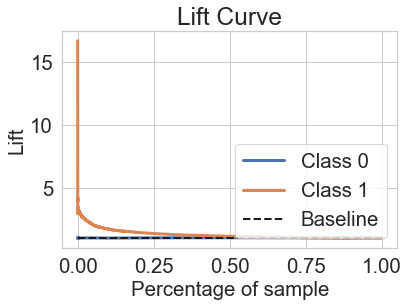

              precision    recall  f1-score   support

           0       0.95      0.77      0.85    369946
           1       0.08      0.33      0.13     23513

    accuracy                           0.74    393459
   macro avg       0.51      0.55      0.49    393459
weighted avg       0.90      0.74      0.80    393459

[[283502  86444]
 [ 15846   7667]]


In [90]:
roc_auc_smote,fpr_smote,tpr_smote, _  = build_and_test(X_res, X_test, y_res, y_test)

- UnderSampler

In [91]:
from imblearn.under_sampling import RandomUnderSampler
under_sampler = RandomUnderSampler(random_state=42)
X_res, y_res = under_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 48144, 1: 48144})
Testing target statistics: Counter({0: 369946, 1: 23513})


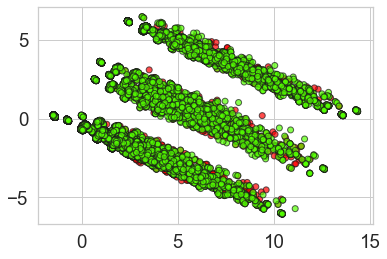

Resultado da prescisão 0.08426751698138275
Resultado do recall 0.4315910347467358
Resultado F1 0.1410041753798484
Resultado acurácia 0.6857537888318732
Sensibilidade:  0.4315910347467358
Especificação:  0.7019078460099583


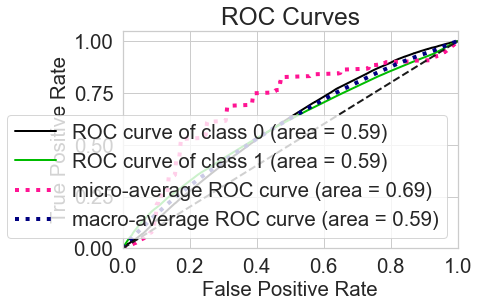

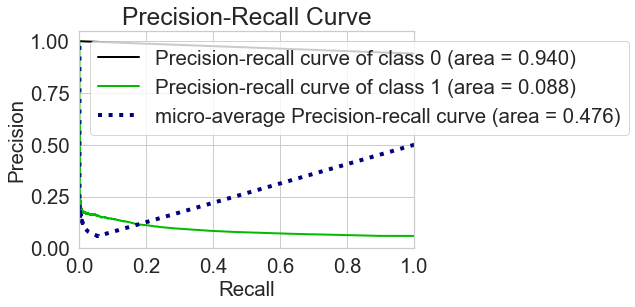

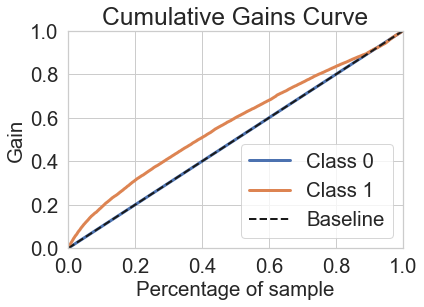

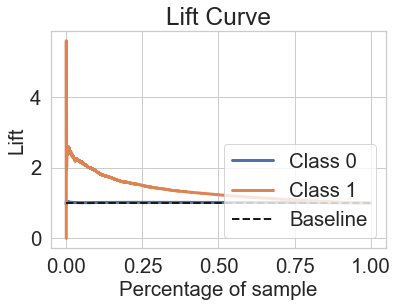

              precision    recall  f1-score   support

           0       0.95      0.70      0.81    369946
           1       0.08      0.43      0.14     23513

    accuracy                           0.69    393459
   macro avg       0.52      0.57      0.47    393459
weighted avg       0.90      0.69      0.77    393459

[[259668 110278]
 [ 13365  10148]]


In [92]:
roc_auc_rus1,fpr_rus1,tpr_rus1 , _ = build_and_test(X_res, X_test, y_res, y_test)

- NearMiss

In [93]:
from imblearn.under_sampling import NearMiss
under_sampler = NearMiss()
X_res, y_res = under_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 48144, 1: 48144})
Testing target statistics: Counter({0: 369946, 1: 23513})


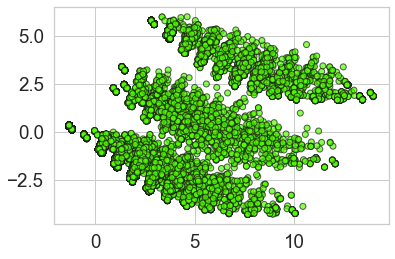

Resultado da prescisão 0.06374911249754521
Resultado do recall 0.5384255518223962
Resultado F1 0.11400064834491949
Resultado acurácia 0.4998614849323564
Sensibilidade:  0.5384255518223962
Especificação:  0.497410432873987


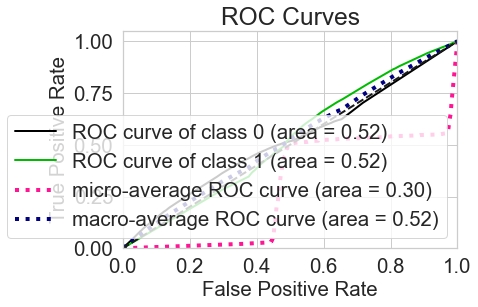

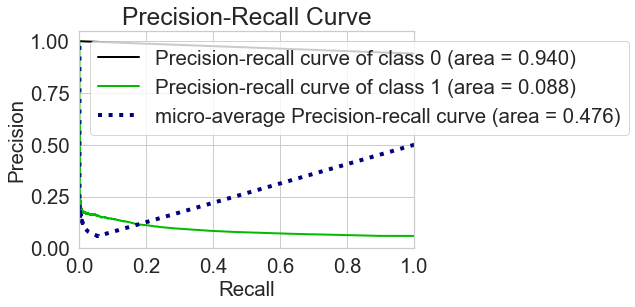

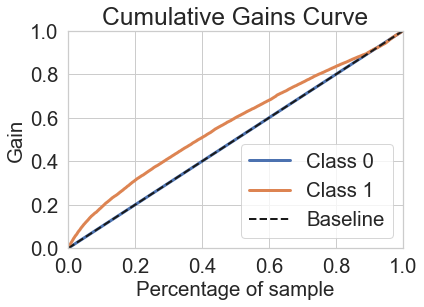

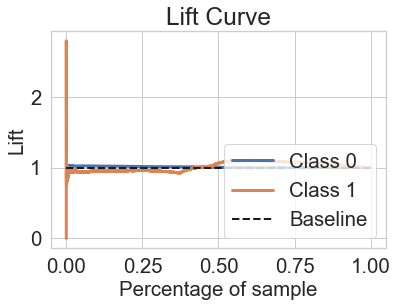

              precision    recall  f1-score   support

           0       0.94      0.50      0.65    369946
           1       0.06      0.54      0.11     23513

    accuracy                           0.50    393459
   macro avg       0.50      0.52      0.38    393459
weighted avg       0.89      0.50      0.62    393459

[[184015 185931]
 [ 10853  12660]]


In [94]:
roc_auc_nm1,fpr_nm1,tpr_nm1, _  = build_and_test(X_res, X_test, y_res, y_test)

- CW

In [95]:
n= Counter(y_train)
ratio = int(n[0]/n[1])
ratio, n

(15, Counter({0: 750694, 1: 48144}))

In [96]:
n[0]

750694

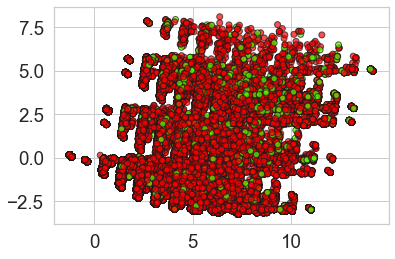

Resultado da prescisão 0.0831513079447487
Resultado do recall 0.33513375579466675
Resultado F1 0.13324315184308422
Resultado acurácia 0.7394391791775
Sensibilidade:  0.33513375579466675
Especificação:  0.7651359928205738


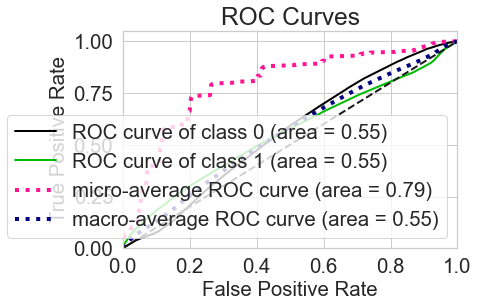

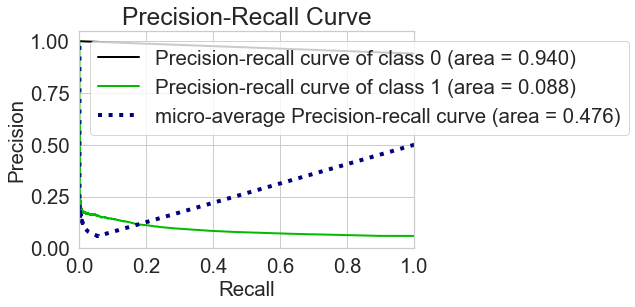

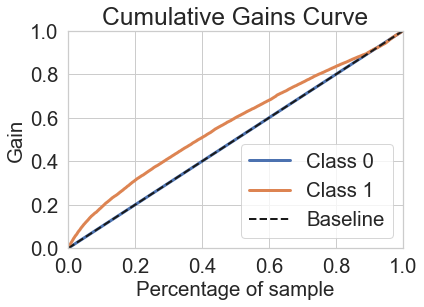

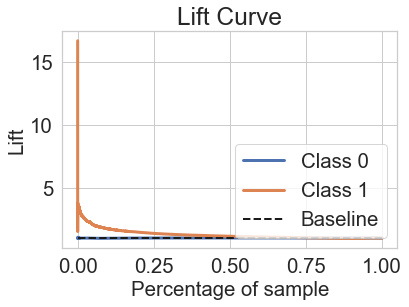

              precision    recall  f1-score   support

           0       0.95      0.77      0.85    369946
           1       0.08      0.34      0.13     23513

    accuracy                           0.74    393459
   macro avg       0.52      0.55      0.49    393459
weighted avg       0.90      0.74      0.80    393459

[[283059  86887]
 [ 15633   7880]]


In [97]:
roc_auc_cw,fpr_cw,tpr_cw, _  = build_and_test(X_train, X_test, y_train, y_test, class_weight={0:1, 1:ratio})

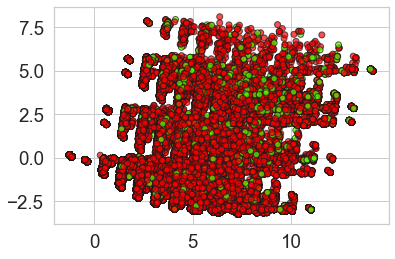

Resultado da prescisão 0.18128654970760233
Resultado do recall 0.007910517586016247
Resultado F1 0.015159541953624843
Resultado acurácia 0.9385780983533227
Sensibilidade:  0.007910517586016247
Especificação:  0.9977293983446233


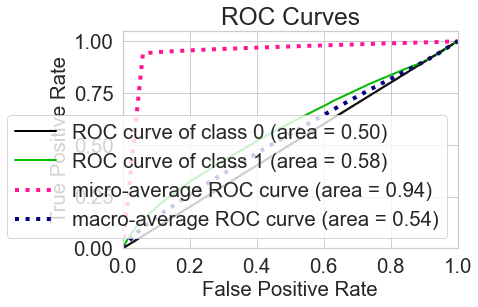

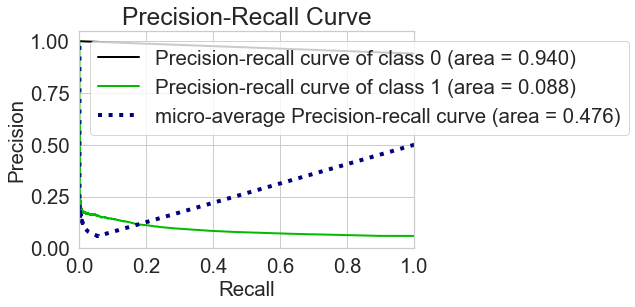

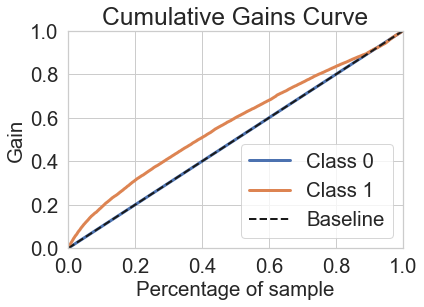

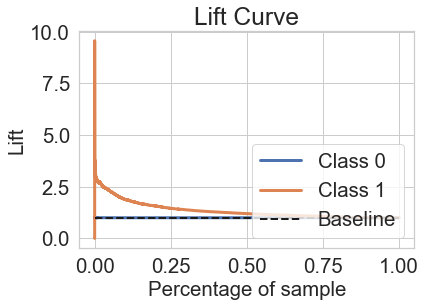

              precision    recall  f1-score   support

           0       0.94      1.00      0.97    369946
           1       0.18      0.01      0.02     23513

    accuracy                           0.94    393459
   macro avg       0.56      0.50      0.49    393459
weighted avg       0.90      0.94      0.91    393459

[[369106    840]
 [ 23327    186]]
Best Treshold: 0.0648343080205915


In [98]:
roc_auc_thr,fpr_thr,tpr_thr, threshold = build_and_test(X_train, X_test, y_train, y_test, threshold=True)
print(f"Best Treshold: {threshold}")

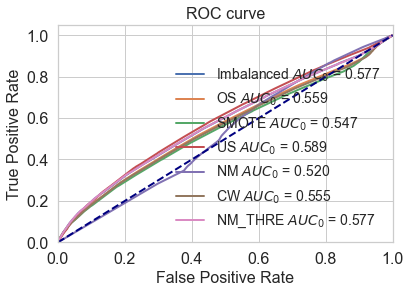

In [99]:
plt.plot(fpr_imb, tpr_imb, lw=2, label='Imbalanced $AUC_0$ = %.3f' % (roc_auc_imb))
plt.plot(fpr_ros, tpr_ros, lw=2, label='OS $AUC_0$ = %.3f' % (roc_auc_ros))
plt.plot(fpr_smote, tpr_smote, lw=2, label='SMOTE $AUC_0$ = %.3f' % (roc_auc_smote))
plt.plot(fpr_rus1, tpr_rus1, lw=2, label='US $AUC_0$ = %.3f' % (roc_auc_rus1))
plt.plot(fpr_nm1, tpr_nm1, lw=2, label='NM $AUC_0$ = %.3f' % (roc_auc_nm1))
plt.plot(fpr_cw, tpr_cw, lw=2, label='CW $AUC_0$ = %.3f' % (roc_auc_cw))
plt.plot(fpr_thr, tpr_thr, lw=2, label='NM_THRE $AUC_0$ = %.3f' % (roc_auc_thr))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=16)
plt.ylabel('True Positive Rate', fontsize=16)
plt.title('ROC curve', fontsize=16)
plt.legend(loc="lower right", fontsize=14, frameon=False)
plt.tick_params(axis='both', which='major', labelsize=16)
plt.show()

# Regressão Logistíca (Manual)

In [100]:
from sklearn.linear_model import LogisticRegression
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=100)
print(f"Estatísticas do target y: {Counter(y_train)}")
print(f"Estatísticas do target X: {Counter(y_test)}")

Estatísticas do target y: Counter({0: 784451, 1: 50156})
Estatísticas do target X: Counter({0: 336189, 1: 21501})


- Vectorizer, pois é Logit ???? (ValueError: Cannot center sparse matrices: pass `with_mean=False` instead. See docstring for motivation and alternatives.)

In [101]:
#vectorizer = TfidfVectorizer(binary = True)
#matrix = vectorizer.fit_transform(df1)
#X = matrix


In [102]:
scaler = StandardScaler()
scaled_X = scaler.fit_transform(X)

In [103]:
X = scaled_X

In [104]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33)

In [105]:
from sklearn.linear_model import LogisticRegression

In [106]:
from imblearn.over_sampling import RandomOverSampler
over_sampler = RandomOverSampler(sampling_strategy = 'minority', random_state=42)
X_res, y_res = over_sampler.fit_resample(X_train, y_train)


In [107]:
lgt = LogisticRegression()
lgt.fit(X_train, y_train)

LogisticRegression()

In [108]:
y_pred = lgt.predict(X_test)

In [109]:
print(classification_report(y_test, y_pred))

C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.94      1.00      0.97    369676
           1       0.00      0.00      0.00     23783

    accuracy                           0.94    393459
   macro avg       0.47      0.50      0.48    393459
weighted avg       0.88      0.94      0.91    393459



C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [110]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score


In [111]:
print(confusion_matrix(y_test, y_pred))

[[369676      0]
 [ 23783      0]]


In [112]:
a_s = accuracy_score(y_test, y_pred)
print(a_s)

0.9395540577290137


In [113]:
f1 = f1_score(y_test, y_pred)
print(f1)

0.0


In [114]:
y_score = lgt.predict_proba(X_test)
print(y_score)

[[0.96137791 0.03862209]
 [0.96099107 0.03900893]
 [0.94823704 0.05176296]
 ...
 [0.94823704 0.05176296]
 [0.93287715 0.06712285]
 [0.94823704 0.05176296]]


In [115]:
fpr0, tpr0, thresholds = roc_curve(y_test, y_score[:, 1])

In [116]:
roc_auc0 = auc(fpr0, tpr0)

In [117]:
thresholds

array([1.40103944, 0.40103944, 0.36883793, ..., 0.02029313, 0.0202907 ,
       0.01603832])

Youden's J statistic
- https://en.wikipedia.org/wiki/Youden%27s_J_statistic

In [118]:
J = tpr0 - fpr0
print(J)



[ 0.00000000e+00 -2.70507147e-06 -5.41014294e-06 ...  1.89355003e-05
  1.35253573e-05  0.00000000e+00]


In [119]:
ix = argmax(J)
print(ix)

10832


In [120]:
y_score1 = np.array([[1, y[1]] if y[0] >= ix else [0, y[1]] for y in y_score])
print(y_score1)

[[0.         0.03862209]
 [0.         0.03900893]
 [0.         0.05176296]
 ...
 [0.         0.05176296]
 [0.         0.06712285]
 [0.         0.05176296]]


# Resultado Regressão Logística

In [121]:
print('A matriz de classificação: %s' % (classification_report(y_test, y_pred)) )
print('A matriz de confusão: %s' % (confusion_matrix(y_test, y_pred)) )
print('A acurácia do modelo: %s' % accuracy_score(y_test, y_pred) )
print('Valor do F1-score: %s' % f1_score(y_test, y_pred) )



C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: Unde

A matriz de classificação:               precision    recall  f1-score   support

           0       0.94      1.00      0.97    369676
           1       0.00      0.00      0.00     23783

    accuracy                           0.94    393459
   macro avg       0.47      0.50      0.48    393459
weighted avg       0.88      0.94      0.91    393459

A matriz de confusão: [[369676      0]
 [ 23783      0]]
A acurácia do modelo: 0.9395540577290137
Valor do F1-score: 0.0


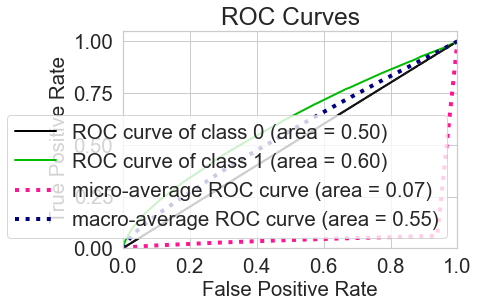

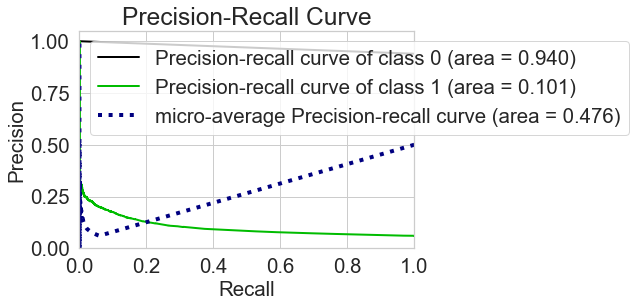

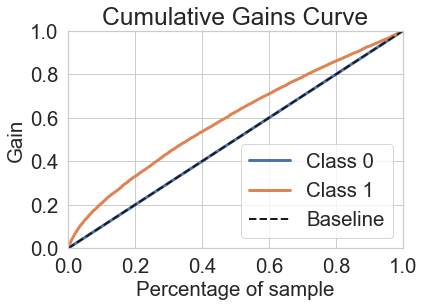

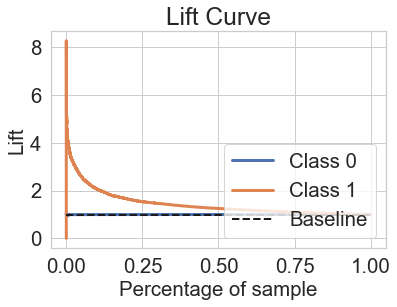

In [122]:
from scikitplot.metrics import plot_roc
from scikitplot.metrics import plot_precision_recall
from scikitplot.metrics import plot_cumulative_gain
from scikitplot.metrics import plot_lift_curve
plot_roc(y_test, y_score1)
plt.show()
    
plot_precision_recall(y_test, y_score1)
plt.show()
    
plot_cumulative_gain(y_test, y_score1)
plt.show()
    
plot_lift_curve(y_test, y_score1)
plt.show()

# Regressão Logística DEF ✅

In [123]:

import scikitplot as skplt
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve, auc, roc_auc_score

import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import PrecisionRecallDisplay
from numpy import argmax
import numpy as np

def build_and_test(X_tr, X_te, y_tr, y_te, class_weight=None, threshold=False):
    
    # Construindo PCA
    pca = PCA(n_components=15)
    pca.fit(X_tr.tolist())
    X_pca = pca.transform(X_tr.tolist())

    plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_tr, cmap=plt.cm.prism, edgecolor='k', alpha=0.7)
    plt.show()
    
    # Construindo Modelo
    if class_weight:
        model = LogisticRegression()
    else:
        model = LogisticRegression()
    model.fit(X_tr, y_tr)
    
    # Teste do modelo
    y_pred = model.predict(X_te)
    print('Resultado da prescisão %s' % precision_score(y_te, y_pred))
    print('Resultado do recall %s' % recall_score(y_te, y_pred))
    print('Resultado F1 %s' % f1_score(y_te, y_pred))
    print('Resultado acurácia %s' % accuracy_score(y_te, y_pred))
    
    y_score = model.predict_proba(X_te)
    fpr0, tpr0, thresholds = roc_curve(y_te, y_score[:, 1])
    roc_auc0 = auc(fpr0, tpr0)
    cm1 = confusion_matrix(y_test, y_pred)
    total1 = sum(sum(cm1))
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    print('Sensibilidade:  %s' % sensi)
    print('Especificação:  %s' % speci)
    
    # Calculando o melhor threashold
    best_threshold = None
    if threshold:
        J = tpr0 - fpr0
        ix = argmax(J) # valor da maior estatística 
        best_threshold = thresholds[ix]
        # ajuste de acordo com o threshold.
        y_score = np.array([[1, y[1]] if y[0] >= best_threshold else [0, y[1]] for y in y_score])
        
    # Plot 
    plot_roc(y_te, y_score)
    plt.show()
    
    plot_precision_recall(y_te, y_score1)
    plt.show()
    
    plot_cumulative_gain(y_te, y_score1)
    plt.show()
    
    plot_lift_curve(y_te, y_score)
    plt.show()
    
    # Print
    print(classification_report(y_te,y_pred))
    print(confusion_matrix(y_test, y_pred))
    return roc_auc0,fpr0,tpr0, best_threshold

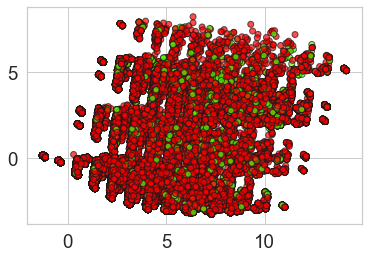

C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Resultado da prescisão 0.0
Resultado do recall 0.0
Resultado F1 0.0
Resultado acurácia 0.9395540577290137
Sensibilidade:  0.0
Especificação:  1.0


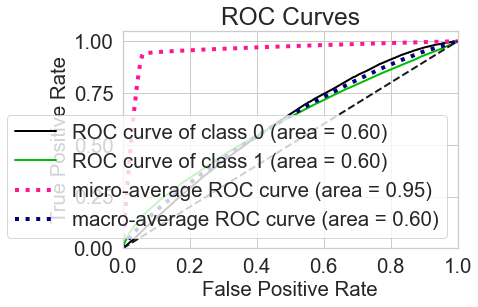

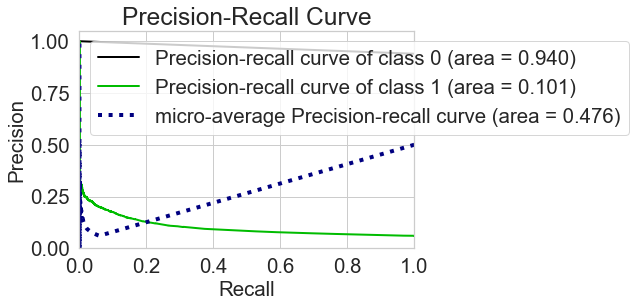

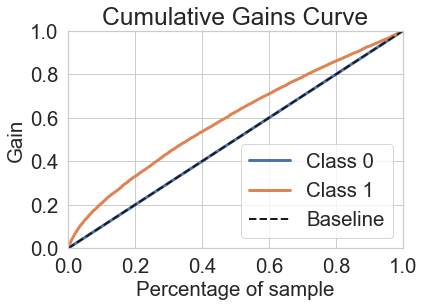

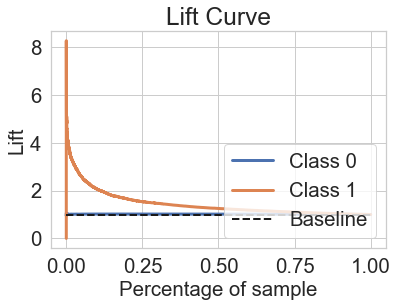

C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.94      1.00      0.97    369676
           1       0.00      0.00      0.00     23783

    accuracy                           0.94    393459
   macro avg       0.47      0.50      0.48    393459
weighted avg       0.88      0.94      0.91    393459

[[369676      0]
 [ 23783      0]]


C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [124]:
roc_auc_imb,fpr_imb,tpr_imb, _ = build_and_test(X_train, X_test, y_train, y_test)

- Oversample 🏆

In [125]:
from imblearn.over_sampling import RandomOverSampler
over_sampler = RandomOverSampler(random_state=42)
X_res, y_res = over_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 750964, 1: 750964})
Testing target statistics: Counter({0: 369676, 1: 23783})


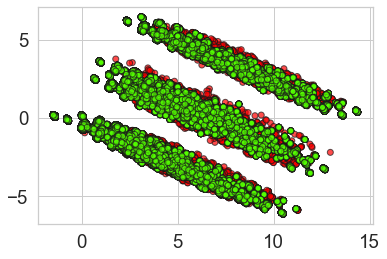

Resultado da prescisão 0.08760503520098628
Resultado do recall 0.4541479207837531
Resultado F1 0.1468774434812171
Resultado acurácia 0.6811027324320958
Sensibilidade:  0.4541479207837531
Especificação:  0.6957038054945411


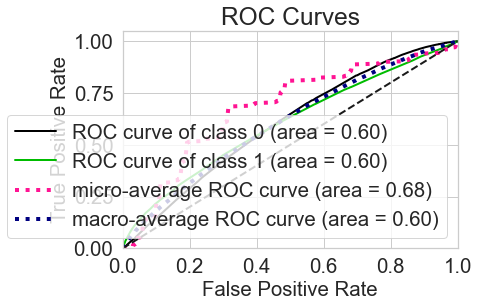

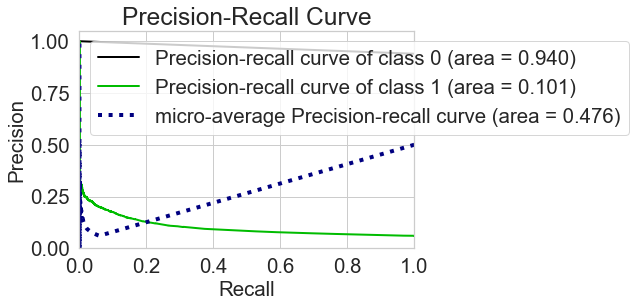

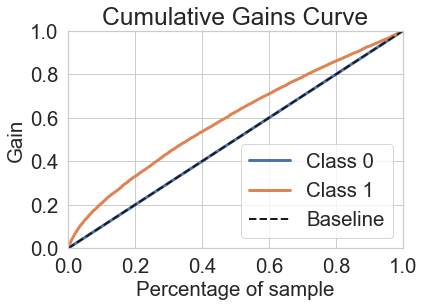

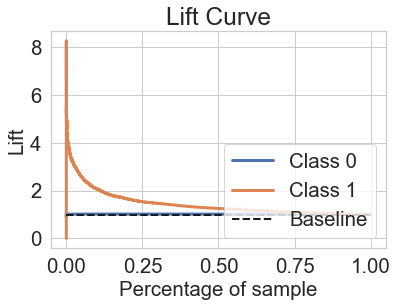

              precision    recall  f1-score   support

           0       0.95      0.70      0.80    369676
           1       0.09      0.45      0.15     23783

    accuracy                           0.68    393459
   macro avg       0.52      0.57      0.48    393459
weighted avg       0.90      0.68      0.76    393459

[[257185 112491]
 [ 12982  10801]]


In [126]:
roc_auc_ros2,fpr_ros2,tpr_ros2, _ = build_and_test(X_res, X_test, y_res, y_test)

- SMOTE

In [127]:
from imblearn.over_sampling import SMOTE
over_sampler = SMOTE(k_neighbors=2)
X_res, y_res = over_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 750964, 1: 750964})
Testing target statistics: Counter({0: 369676, 1: 23783})


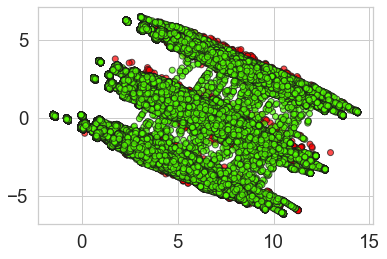

Resultado da prescisão 0.08766360300087687
Resultado do recall 0.45397973342303327
Resultado F1 0.14695094149591348
Resultado acurácia 0.6814077197369993
Sensibilidade:  0.45397973342303327
Especificação:  0.6960392343565717


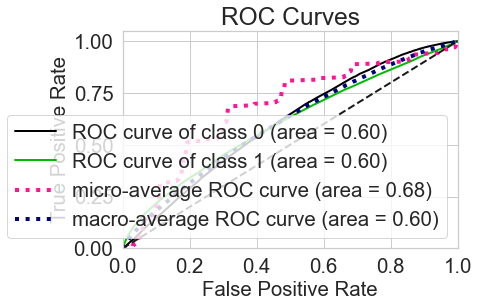

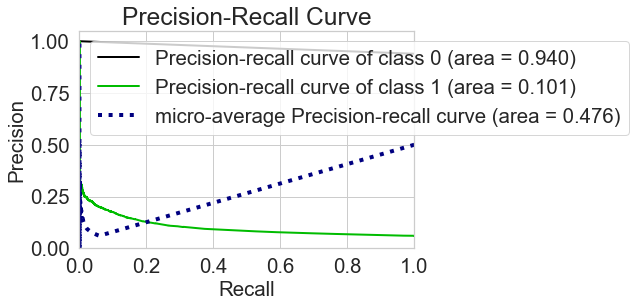

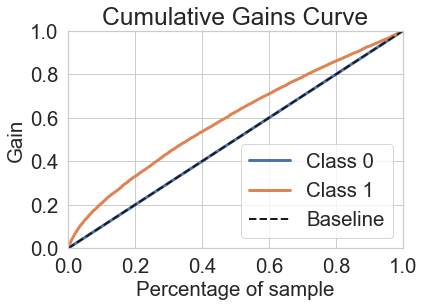

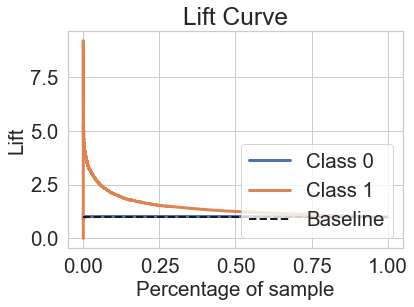

              precision    recall  f1-score   support

           0       0.95      0.70      0.80    369676
           1       0.09      0.45      0.15     23783

    accuracy                           0.68    393459
   macro avg       0.52      0.58      0.48    393459
weighted avg       0.90      0.68      0.76    393459

[[257309 112367]
 [ 12986  10797]]


In [128]:
roc_auc_smote,fpr_smote,tpr_smote, _  = build_and_test(X_res, X_test, y_res, y_test)

- UnderSampler

In [129]:
from imblearn.under_sampling import RandomUnderSampler
under_sampler = RandomUnderSampler(random_state=42)
X_res, y_res = under_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 47874, 1: 47874})
Testing target statistics: Counter({0: 369676, 1: 23783})


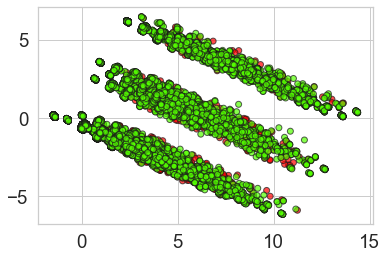

Resultado da prescisão 0.08751544318925074
Resultado do recall 0.4557036538704116
Resultado F1 0.14683249336151305
Resultado acurácia 0.6798954910168531
Sensibilidade:  0.4557036538704116
Especificação:  0.6943188089029312


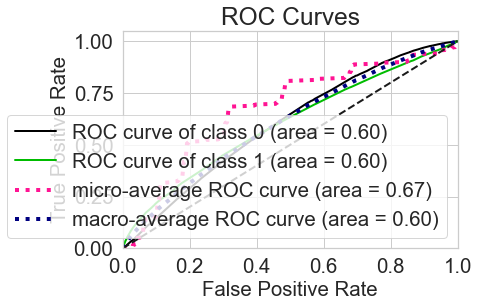

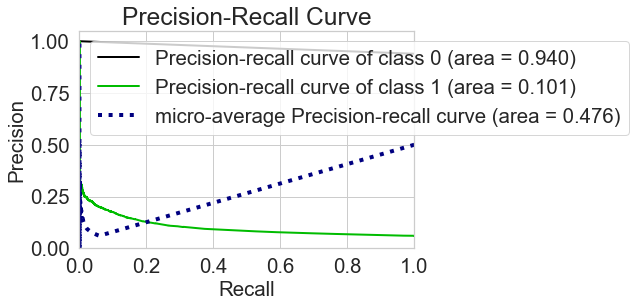

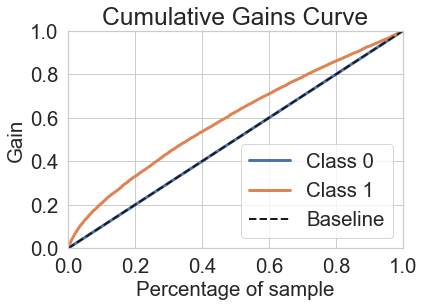

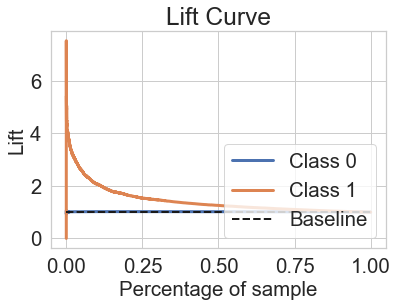

              precision    recall  f1-score   support

           0       0.95      0.69      0.80    369676
           1       0.09      0.46      0.15     23783

    accuracy                           0.68    393459
   macro avg       0.52      0.58      0.47    393459
weighted avg       0.90      0.68      0.76    393459

[[256673 113003]
 [ 12945  10838]]


In [130]:
roc_auc_rus,fpr_rus,tpr_rus , _ = build_and_test(X_res, X_test, y_res, y_test)

- NearMiss

In [131]:
from imblearn.under_sampling import NearMiss
under_sampler = NearMiss()
X_res, y_res = under_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 47874, 1: 47874})
Testing target statistics: Counter({0: 369676, 1: 23783})


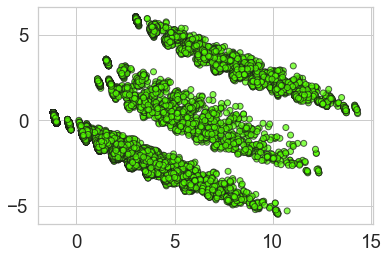

Resultado da prescisão 0.08056091599125177
Resultado do recall 0.3949459698103687
Resultado F1 0.13382438843693456
Resultado acurácia 0.6909665301848478
Sensibilidade:  0.3949459698103687
Especificação:  0.7100109284887307


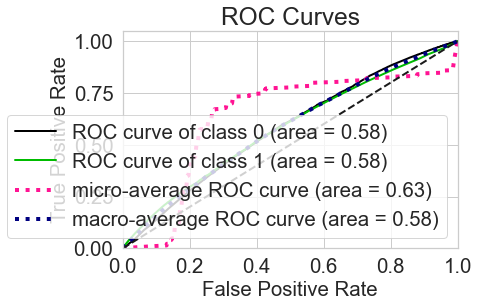

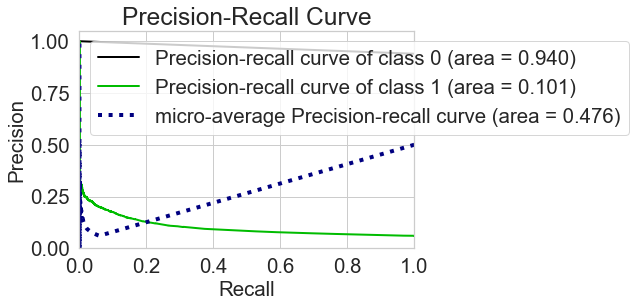

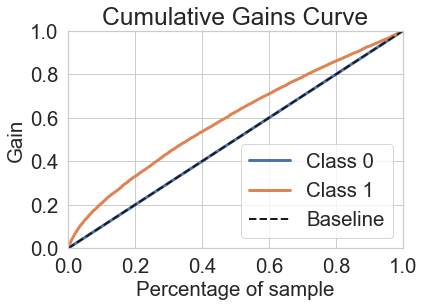

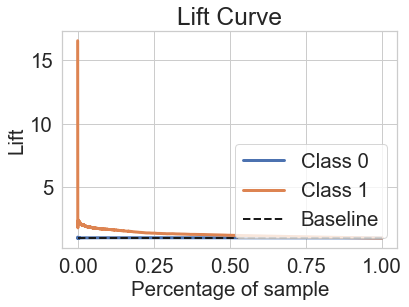

              precision    recall  f1-score   support

           0       0.95      0.71      0.81    369676
           1       0.08      0.39      0.13     23783

    accuracy                           0.69    393459
   macro avg       0.51      0.55      0.47    393459
weighted avg       0.90      0.69      0.77    393459

[[262474 107202]
 [ 14390   9393]]


In [132]:
roc_auc_nm,fpr_nm,tpr_nm, _  = build_and_test(X_res, X_test, y_res, y_test)

- Class Weight

In [133]:
n= Counter(y_train)
ratio = int(n[0]/n[1])
ratio, n

(15, Counter({0: 750964, 1: 47874}))

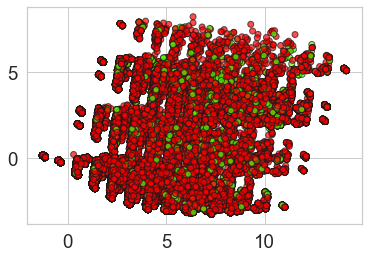

C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Resultado da prescisão 0.0
Resultado do recall 0.0
Resultado F1 0.0
Resultado acurácia 0.9395540577290137
Sensibilidade:  0.0
Especificação:  1.0


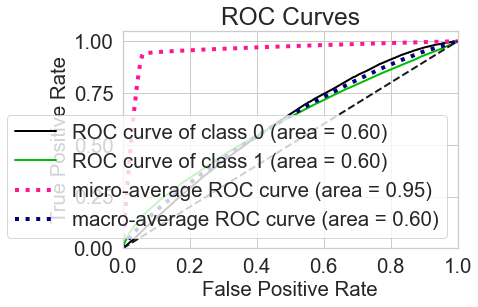

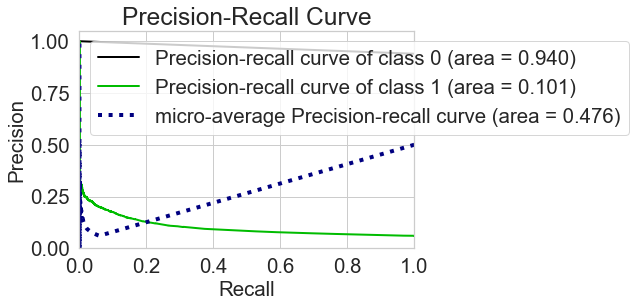

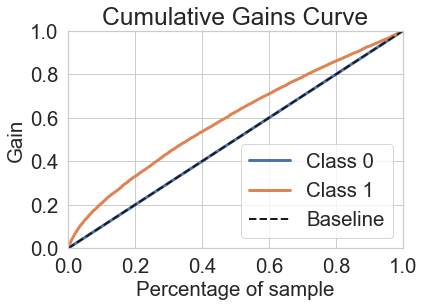

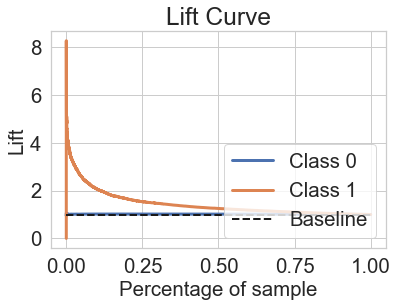

C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.94      1.00      0.97    369676
           1       0.00      0.00      0.00     23783

    accuracy                           0.94    393459
   macro avg       0.47      0.50      0.48    393459
weighted avg       0.88      0.94      0.91    393459

[[369676      0]
 [ 23783      0]]


C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [134]:
roc_auc_cw,fpr_cw,tpr_cw, _  = build_and_test(X_train, X_test, y_train, y_test, class_weight={0:1, 1:ratio})

- Threshold

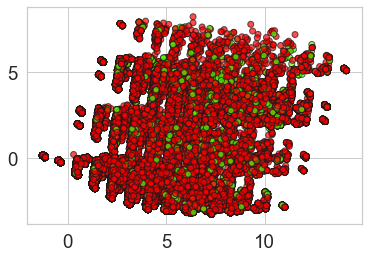

C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Resultado da prescisão 0.0
Resultado do recall 0.0
Resultado F1 0.0
Resultado acurácia 0.9395540577290137
Sensibilidade:  0.0
Especificação:  1.0


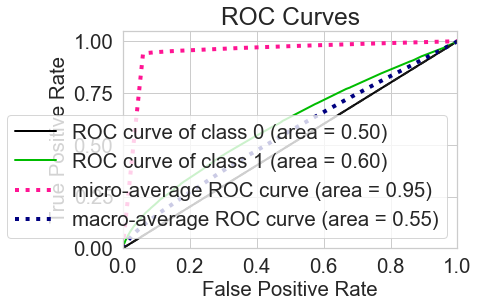

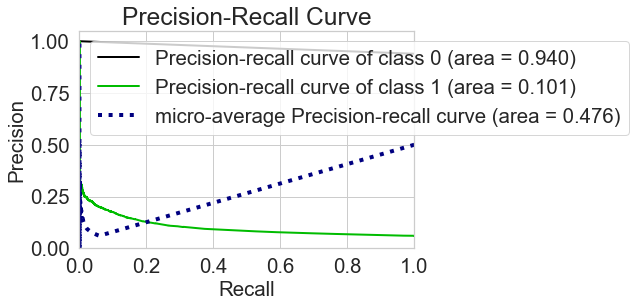

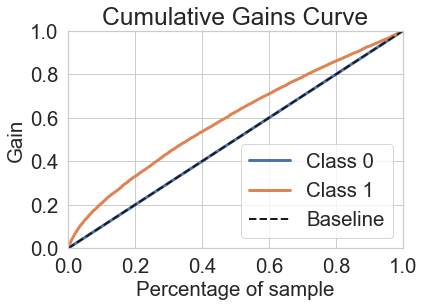

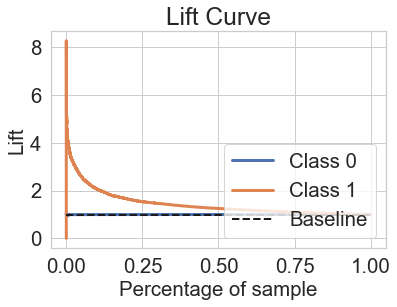

C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

           0       0.94      1.00      0.97    369676
           1       0.00      0.00      0.00     23783

    accuracy                           0.94    393459
   macro avg       0.47      0.50      0.48    393459
weighted avg       0.88      0.94      0.91    393459

[[369676      0]
 [ 23783      0]]
Best Treshold: 0.062320970075577554


C:\Users\erick\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [135]:
roc_auc_thr,fpr_thr,tpr_thr, threshold = build_and_test(X_train, X_test, y_train, y_test, threshold=True)
print(f"Best Treshold: {threshold}")

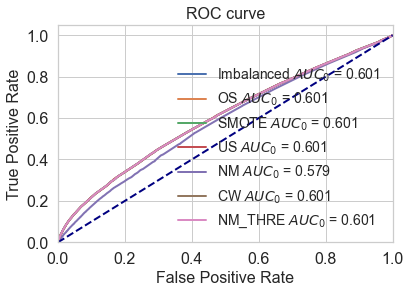

In [136]:
plt.plot(fpr_imb, tpr_imb, lw=2, label='Imbalanced $AUC_0$ = %.3f' % (roc_auc_imb))
plt.plot(fpr_ros2, tpr_ros2, lw=2, label='OS $AUC_0$ = %.3f' % (roc_auc_ros2))
plt.plot(fpr_smote, tpr_smote, lw=2, label='SMOTE $AUC_0$ = %.3f' % (roc_auc_smote))
plt.plot(fpr_rus, tpr_rus, lw=2, label='US $AUC_0$ = %.3f' % (roc_auc_rus))
plt.plot(fpr_nm, tpr_nm, lw=2, label='NM $AUC_0$ = %.3f' % (roc_auc_nm))
plt.plot(fpr_cw, tpr_cw, lw=2, label='CW $AUC_0$ = %.3f' % (roc_auc_cw))
plt.plot(fpr_thr, tpr_thr, lw=2, label='NM_THRE $AUC_0$ = %.3f' % (roc_auc_thr))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=16)
plt.ylabel('True Positive Rate', fontsize=16)
plt.title('ROC curve', fontsize=16)
plt.legend(loc="lower right", fontsize=14, frameon=False)
plt.tick_params(axis='both', which='major', labelsize=16)
plt.show()

# Decision Tree (Manual)

In [137]:
from sklearn.tree import DecisionTreeClassifier

In [138]:
X = df1

In [139]:
y = df['result_igm']

In [140]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled_X = scaler.fit_transform(X)

In [141]:
X = scaled_X

In [142]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33)

In [143]:
from sklearn.tree import DecisionTreeClassifier
d_t = DecisionTreeClassifier()
d_t.fit(X_train, y_train)

DecisionTreeClassifier()

In [144]:
y_pred = d_t.predict(X_test)

In [145]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.94      1.00      0.97    369488
           1       0.17      0.01      0.02     23971

    accuracy                           0.94    393459
   macro avg       0.56      0.50      0.49    393459
weighted avg       0.89      0.94      0.91    393459



In [146]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

In [147]:
print(confusion_matrix(y_test, y_pred))

[[368181   1307]
 [ 23696    275]]


In [148]:
a_s = accuracy_score(y_test, y_pred)
print(a_s)

0.9364533534624955


In [149]:
f1 = f1_score(y_test, y_pred)
print(f1)

0.021523891519586745


In [150]:
y_score = d_t.predict_proba(X_test)
print(y_score)

[[0.94601731 0.05398269]
 [0.89320388 0.10679612]
 [0.9608834  0.0391166 ]
 ...
 [1.         0.        ]
 [0.95997829 0.04002171]
 [0.94403616 0.05596384]]


In [151]:
fpr0, tpr0, thresholds = roc_curve(y_test, y_score[:, 1])

In [152]:
roc_auc0 = auc(fpr0, tpr0)

In [153]:
thresholds

array([2.        , 1.        , 0.75      , 0.66666667, 0.625     ,
       0.6       , 0.57142857, 0.55555556, 0.5       , 0.47619048,
       0.46153846, 0.45454545, 0.44444444, 0.42857143, 0.421875  ,
       0.41666667, 0.4       , 0.38888889, 0.38461538, 0.375     ,
       0.36363636, 0.35714286, 0.35294118, 0.33333333, 0.32142857,
       0.32      , 0.31578947, 0.3125    , 0.30769231, 0.3       ,
       0.29411765, 0.28571429, 0.28      , 0.27777778, 0.27368421,
       0.27272727, 0.26666667, 0.26530612, 0.26315789, 0.26153846,
       0.25925926, 0.25581395, 0.25      , 0.24137931, 0.24      ,
       0.23809524, 0.23529412, 0.23333333, 0.23247232, 0.23076923,
       0.22881356, 0.22727273, 0.22535211, 0.22222222, 0.21875   ,
       0.2173913 , 0.21621622, 0.21428571, 0.21212121, 0.21014493,
       0.20930233, 0.20833333, 0.20689655, 0.20588235, 0.20348837,
       0.2       , 0.19565217, 0.19354839, 0.19230769, 0.19047619,
       0.1875    , 0.18604651, 0.18518519, 0.18487395, 0.18421

Youden's J statistic
- https://en.wikipedia.org/wiki/Youden%27s_J_statistic

In [154]:
J = tpr0 - fpr0
print(J)



[ 0.          0.00622409  0.00634224  0.00760972  0.0076043   0.00777771
  0.00787038  0.00793487  0.0122745   0.01232275  0.01230381  0.01227674
  0.01243391  0.01262532  0.0128578   0.01283615  0.01386863  0.0139277
  0.01404156  0.01432994  0.01447357  0.01458249  0.01459985  0.01792753
  0.01798661  0.01810476  0.01839631  0.01865156  0.01888945  0.01924932
  0.01939183  0.02096524  0.02102702  0.02113976  0.02135983  0.02195217
  0.02206715  0.02202656  0.02211111  0.02229375  0.02224504  0.02243038
  0.02488518  0.02486624  0.02489825  0.02512373  0.02538281  0.02542294
  0.02767781  0.02761463  0.02775509  0.02778869  0.02789984  0.02837535
  0.02839924  0.02865785  0.02866979  0.02905197  0.02918207  0.02965897
  0.02980148  0.02999765  0.0300026   0.02994147  0.03031982  0.03288241
  0.03298321  0.03293179  0.0329595   0.03309884  0.03350715  0.03359982
  0.03382148  0.03425013  0.0343065   0.03502353  0.03590603  0.03625191
  0.03664696  0.03667626  0.03810175  0.03817006  0.

In [155]:
ix = argmax(J)
print(ix)

351


In [156]:
y_score1 = np.array([[1, y[1]] if y[0] >= ix else [0, y[1]] for y in y_score])
print(y_score1)

[[0.         0.05398269]
 [0.         0.10679612]
 [0.         0.0391166 ]
 ...
 [0.         0.        ]
 [0.         0.04002171]
 [0.         0.05596384]]


# Resultado Decision Tree 

In [157]:
print('A matriz de classificação: %s' % (classification_report(y_test, y_pred)) )
print('A matriz de confusão: %s' % (confusion_matrix(y_test, y_pred)) )
print('A acurácia do modelo: %s' % accuracy_score(y_test, y_pred) )
print('Valor do F1-score: %s' % f1_score(y_test, y_pred) )



A matriz de classificação:               precision    recall  f1-score   support

           0       0.94      1.00      0.97    369488
           1       0.17      0.01      0.02     23971

    accuracy                           0.94    393459
   macro avg       0.56      0.50      0.49    393459
weighted avg       0.89      0.94      0.91    393459

A matriz de confusão: [[368181   1307]
 [ 23696    275]]
A acurácia do modelo: 0.9364533534624955
Valor do F1-score: 0.021523891519586745


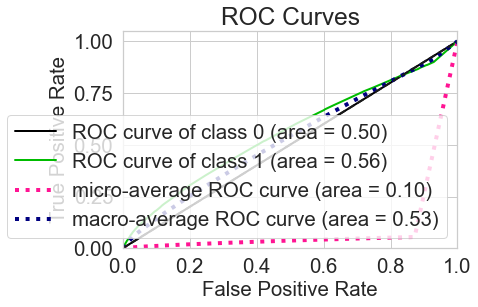

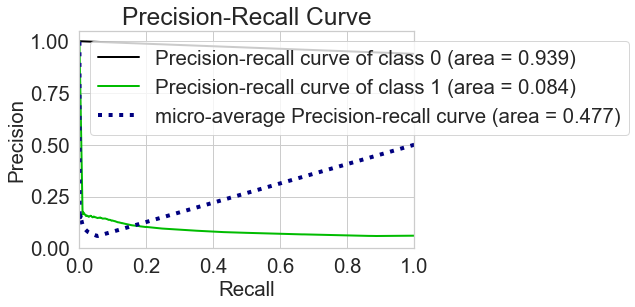

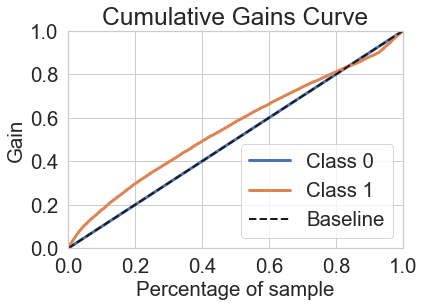

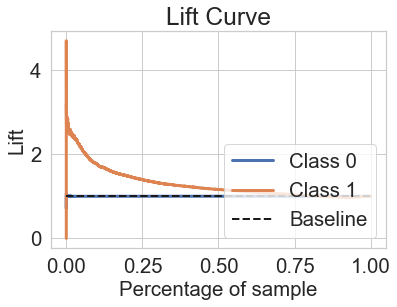

In [158]:
from scikitplot.metrics import plot_roc
from scikitplot.metrics import plot_precision_recall
from scikitplot.metrics import plot_cumulative_gain
from scikitplot.metrics import plot_lift_curve
plot_roc(y_test, y_score1)
plt.show()
    
plot_precision_recall(y_test, y_score1)
plt.show()
    
plot_cumulative_gain(y_test, y_score1)
plt.show()
    
plot_lift_curve(y_test, y_score1)
plt.show()

# Decision Tree DEF ✅

In [159]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve, auc, roc_auc_score
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report

from scikitplot.metrics import plot_roc
from scikitplot.metrics import plot_precision_recall
from scikitplot.metrics import plot_cumulative_gain
from scikitplot.metrics import plot_lift_curve

from numpy import argmax
import numpy as np

def build_and_test(X_tr, X_te, y_tr, y_te, class_weight=None, threshold=False):
    
    # PCA
    pca = PCA(n_components=2)
    pca.fit(X_tr.tolist())
    X_pca = pca.transform(X_tr.tolist())

    plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_tr, cmap=plt.cm.prism, edgecolor='k', alpha=0.7)
    plt.show()
    
    # construindo modelo
    if class_weight:
        model = DecisionTreeClassifier(class_weight=class_weight)
    else:
        model = DecisionTreeClassifier()
    model.fit(X_tr, y_tr)
    
    # modelo
    y_pred = model.predict(X_te)
    print('Precision score %s' % precision_score(y_te, y_pred))
    print('Recall score %s' % recall_score(y_te, y_pred))
    print('F1-score score %s' % f1_score(y_te, y_pred))
    print('Accuracy score %s' % accuracy_score(y_te, y_pred))
    
    y_score = model.predict_proba(X_te)
    fpr0, tpr0, thresholds = roc_curve(y_te, y_score[:, 1])
    roc_auc0 = auc(fpr0, tpr0)
    cm1 = confusion_matrix(y_test, y_pred)
    total1 = sum(sum(cm1))
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    print('Sensibilidade:  %s' % sensi)
    print('Especificação:  %s' % speci)
    
    # Calculate the best threshold
    best_threshold = None
    if threshold:
        J = tpr0 - fpr0
        ix = argmax(J) # valores que maximizam a estatística J
        best_threshold = thresholds[ix]
        # ajuste de score de acordo com threshold.
        y_score = np.array([[1, y[1]] if y[0] >= best_threshold else [0, y[1]] for y in y_score])
        
    
    # Plot
    plot_roc(y_te, y_score)
    plt.show()
    
    plot_precision_recall(y_te, y_score)
    plt.show()
    
    plot_cumulative_gain(y_te, y_score)
    plt.show()
    
    plot_lift_curve(y_te, y_score)
    plt.show()
    
    # Print
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_te,y_pred))
    return roc_auc0,fpr0,tpr0, best_threshold

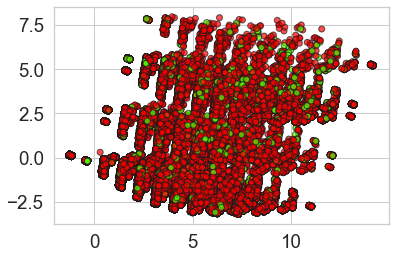

Precision score 0.17
Recall score 0.011347044345250511
F1-score score 0.02127409956591451
Accuracy score 0.9363923560015148
Sensibilidade:  0.011347044345250511
Especificação:  0.9964058372667042


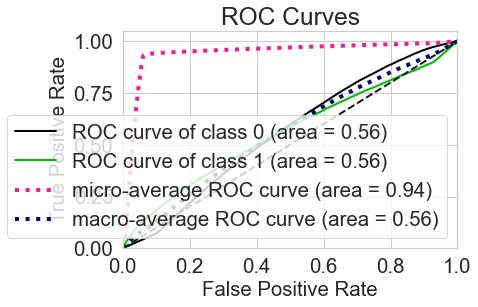

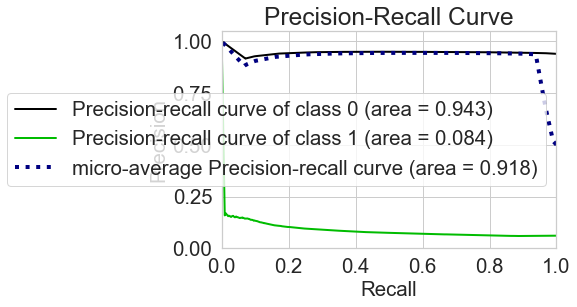

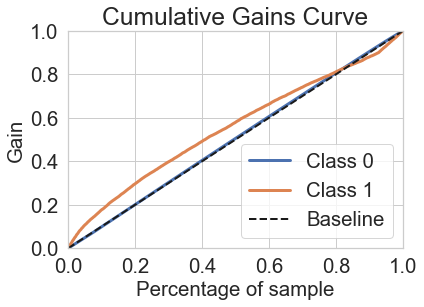

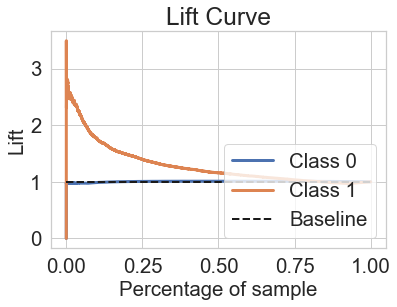

[[368160   1328]
 [ 23699    272]]
              precision    recall  f1-score   support

           0       0.94      1.00      0.97    369488
           1       0.17      0.01      0.02     23971

    accuracy                           0.94    393459
   macro avg       0.55      0.50      0.49    393459
weighted avg       0.89      0.94      0.91    393459



In [160]:
roc_auc_imb,fpr_imb,tpr_imb, _ = build_and_test(X_train, X_test, y_train, y_test)

- OverSample

In [161]:
from imblearn.over_sampling import RandomOverSampler
over_sampler = RandomOverSampler(random_state=42)
X_res, y_res = over_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 751152, 1: 751152})
Testing target statistics: Counter({0: 369488, 1: 23971})


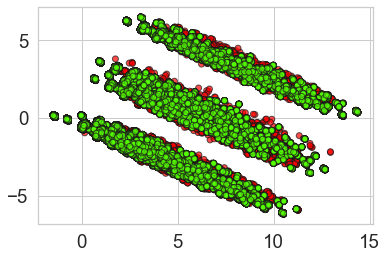

Precision score 0.08351375537657689
Recall score 0.3620624921780485
F1-score score 0.13572176959044208
Accuracy score 0.7190660272099507
Sensibilidade:  0.3620624921780485
Especificação:  0.7422270817996796


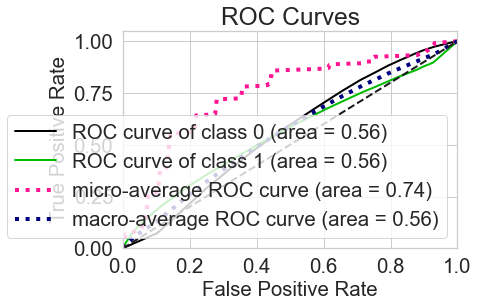

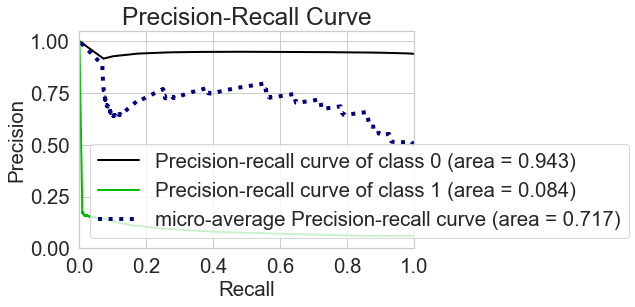

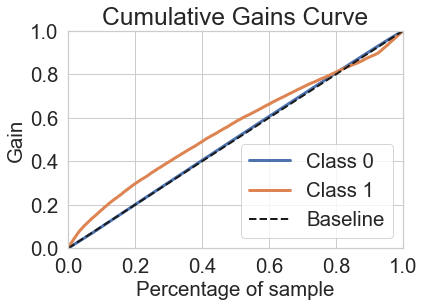

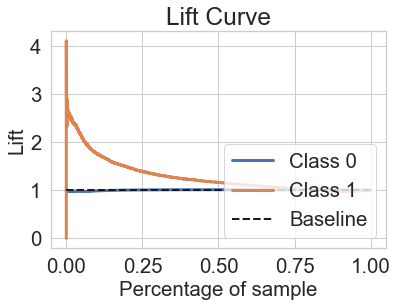

[[274244  95244]
 [ 15292   8679]]
              precision    recall  f1-score   support

           0       0.95      0.74      0.83    369488
           1       0.08      0.36      0.14     23971

    accuracy                           0.72    393459
   macro avg       0.52      0.55      0.48    393459
weighted avg       0.89      0.72      0.79    393459



In [162]:
roc_auc_ros,fpr_ros,tpr_ros, _ = build_and_test(X_res, X_test, y_res, y_test)

- Smote

In [163]:
from imblearn.over_sampling import SMOTE
over_sampler = SMOTE(k_neighbors=2)
X_res, y_res = over_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 751152, 1: 751152})
Testing target statistics: Counter({0: 369488, 1: 23971})


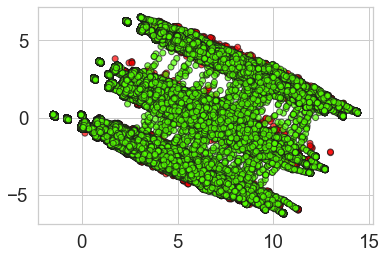

Precision score 0.07681468130427659
Recall score 0.39113929331275293
F1-score score 0.12841109079578994
Accuracy score 0.6765126734932991
Sensibilidade:  0.39113929331275293
Especificação:  0.6950266314467588


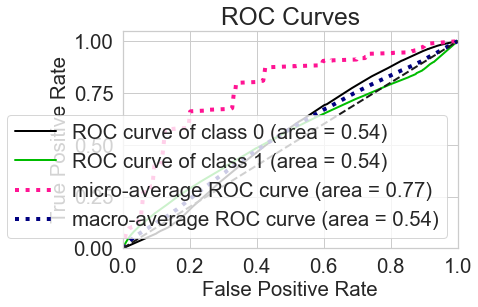

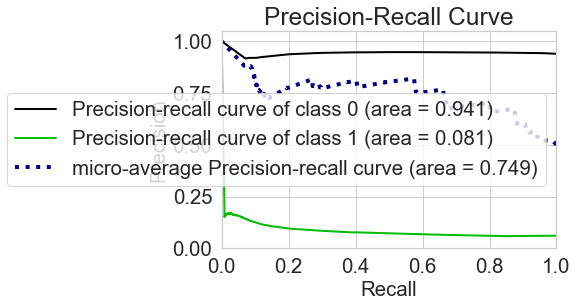

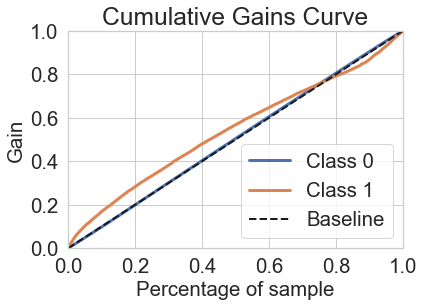

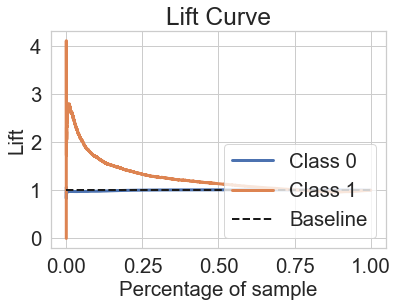

[[256804 112684]
 [ 14595   9376]]
              precision    recall  f1-score   support

           0       0.95      0.70      0.80    369488
           1       0.08      0.39      0.13     23971

    accuracy                           0.68    393459
   macro avg       0.51      0.54      0.46    393459
weighted avg       0.89      0.68      0.76    393459



In [164]:
roc_auc_smote,fpr_smote,tpr_smote, _  = build_and_test(X_res, X_test, y_res, y_test)

- Undersample

In [165]:
from imblearn.under_sampling import RandomUnderSampler

under_sampler = RandomUnderSampler(random_state=42)
X_res, y_res = under_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 47686, 1: 47686})
Testing target statistics: Counter({0: 369488, 1: 23971})


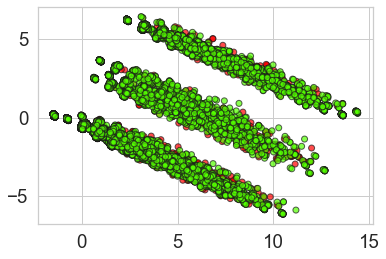

Precision score 0.08450291618951238
Recall score 0.39710483500896915
F1-score score 0.1393520619537689
Accuracy score 0.7011632724121192
Sensibilidade:  0.39710483500896915
Especificação:  0.720889447018577


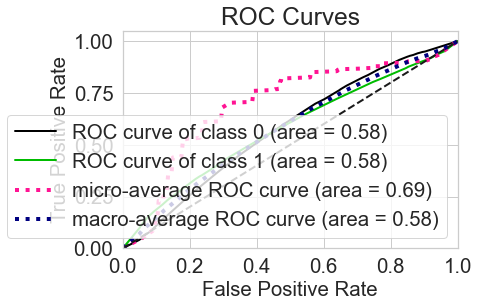

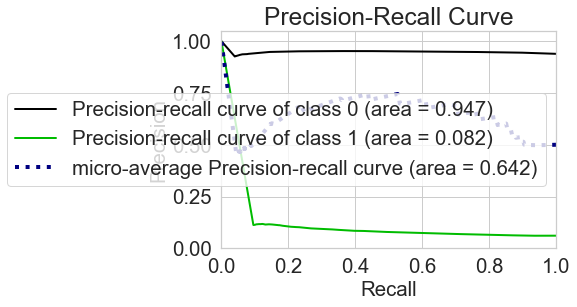

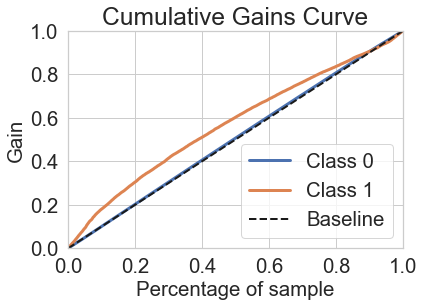

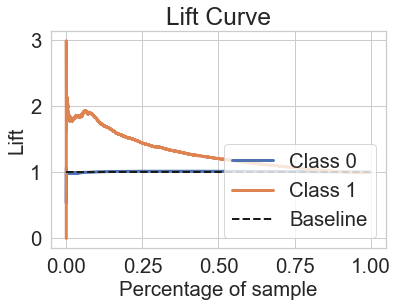

[[266360 103128]
 [ 14452   9519]]
              precision    recall  f1-score   support

           0       0.95      0.72      0.82    369488
           1       0.08      0.40      0.14     23971

    accuracy                           0.70    393459
   macro avg       0.52      0.56      0.48    393459
weighted avg       0.90      0.70      0.78    393459



In [166]:
roc_auc_rus3,fpr_rus3,tpr_rus3 , _ = build_and_test(X_res, X_test, y_res, y_test)

- Near Miss Under Sampler

In [167]:
from imblearn.under_sampling import NearMiss

under_sampler = NearMiss()
X_res, y_res = under_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 47686, 1: 47686})
Testing target statistics: Counter({0: 369488, 1: 23971})


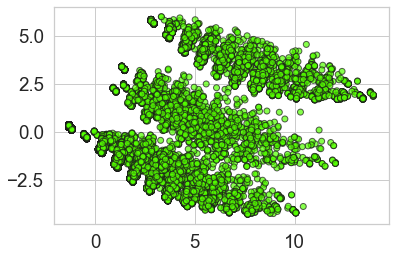

Precision score 0.0653320626054339
Recall score 0.534771181844729
F1-score score 0.11643897830905062
Accuracy score 0.5055494981688053
Sensibilidade:  0.534771181844729
Especificação:  0.5036537045858053


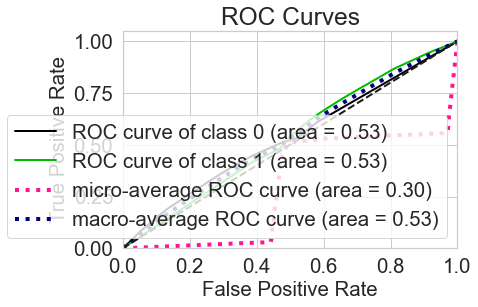

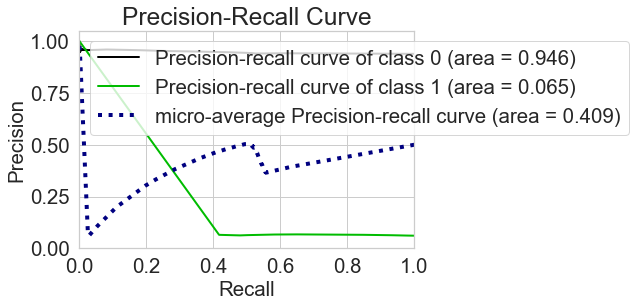

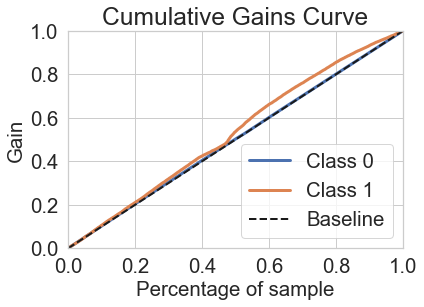

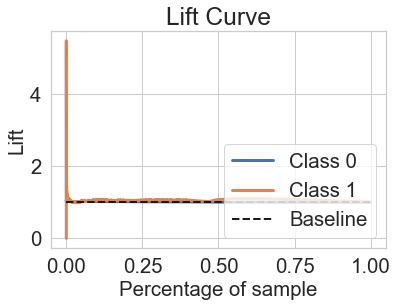

[[186094 183394]
 [ 11152  12819]]
              precision    recall  f1-score   support

           0       0.94      0.50      0.66    369488
           1       0.07      0.53      0.12     23971

    accuracy                           0.51    393459
   macro avg       0.50      0.52      0.39    393459
weighted avg       0.89      0.51      0.62    393459



In [168]:
roc_auc_nm,fpr_nm,tpr_nm, _  = build_and_test(X_res, X_test, y_res, y_test)

- Class Weight

In [169]:
n= Counter(y_train)
ratio = int(n[0]/n[1])
ratio, n

(15, Counter({0: 751152, 1: 47686}))

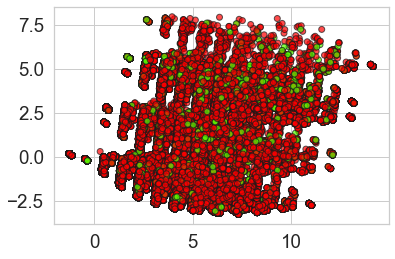

Precision score 0.08932876065508587
Recall score 0.29990405072796295
F1-score score 0.1376556979961512
Accuracy score 0.7710790705003571
Sensibilidade:  0.29990405072796295
Especificação:  0.8016471441562378


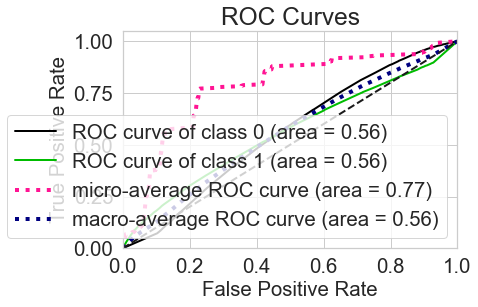

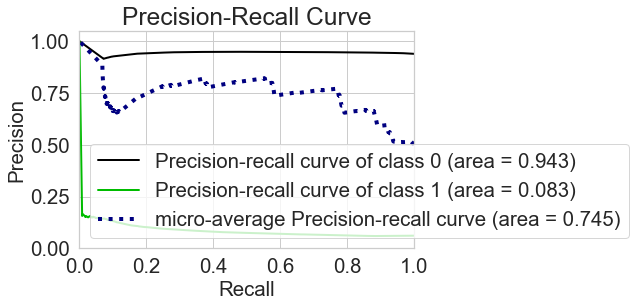

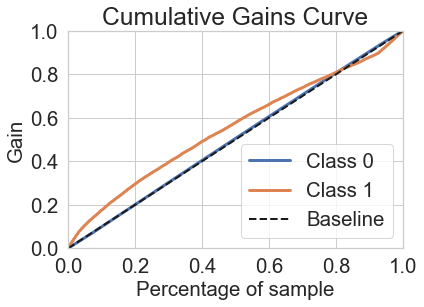

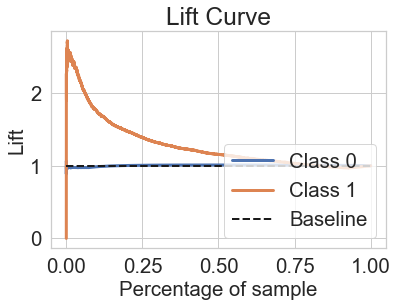

[[296199  73289]
 [ 16782   7189]]
              precision    recall  f1-score   support

           0       0.95      0.80      0.87    369488
           1       0.09      0.30      0.14     23971

    accuracy                           0.77    393459
   macro avg       0.52      0.55      0.50    393459
weighted avg       0.89      0.77      0.82    393459



In [170]:
roc_auc_cw,fpr_cw,tpr_cw, _  = build_and_test(X_train, X_test, y_train, y_test, class_weight={0:1, 1:ratio})

- Threshold

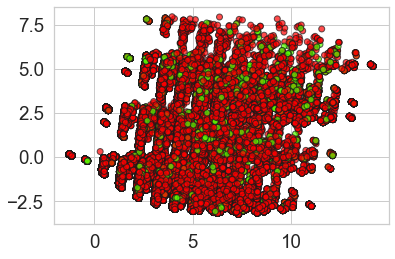

Precision score 0.16908517350157728
Recall score 0.01118017604605565
F1-score score 0.020973548286116764
Accuracy score 0.9364101469276341
Sensibilidade:  0.01118017604605565
Especificação:  0.996435608192959


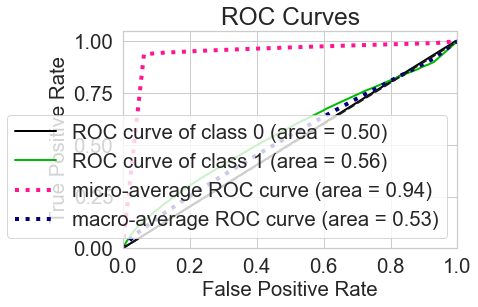

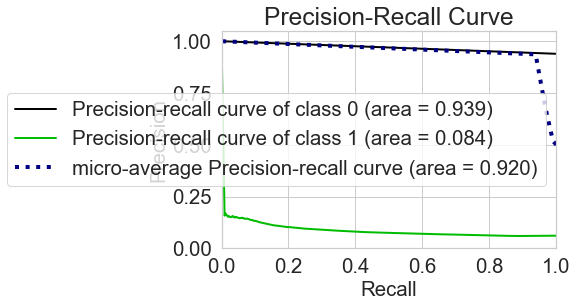

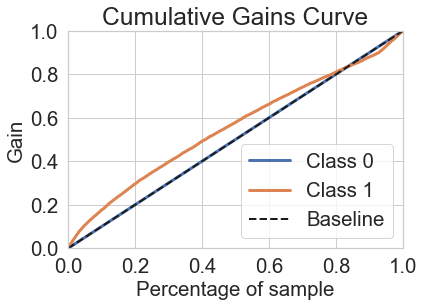

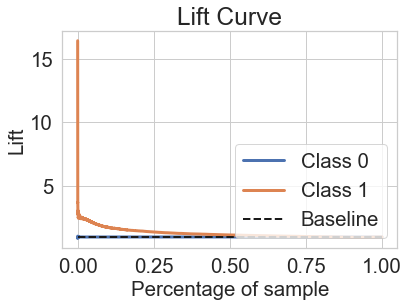

[[368171   1317]
 [ 23703    268]]
              precision    recall  f1-score   support

           0       0.94      1.00      0.97    369488
           1       0.17      0.01      0.02     23971

    accuracy                           0.94    393459
   macro avg       0.55      0.50      0.49    393459
weighted avg       0.89      0.94      0.91    393459

Best Treshold: 0.061224489795918366


In [171]:
roc_auc_thr,fpr_thr,tpr_thr, threshold = build_and_test(X_train, X_test, y_train, y_test, threshold=True)
print(f"Best Treshold: {threshold}")

- Plot

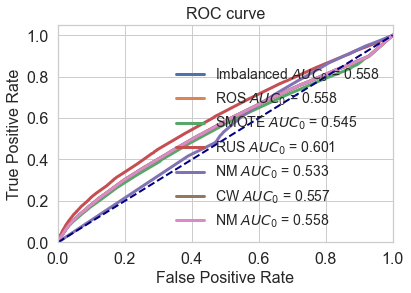

In [172]:
plt.plot(fpr_imb, tpr_imb, lw=3, label='Imbalanced $AUC_0$ = %.3f' % (roc_auc_imb))
plt.plot(fpr_ros, tpr_ros, lw=3, label='ROS $AUC_0$ = %.3f' % (roc_auc_ros))
plt.plot(fpr_smote, tpr_smote, lw=3, label='SMOTE $AUC_0$ = %.3f' % (roc_auc_smote))
plt.plot(fpr_rus, tpr_rus, lw=3, label='RUS $AUC_0$ = %.3f' % (roc_auc_rus))
plt.plot(fpr_nm, tpr_nm, lw=3, label='NM $AUC_0$ = %.3f' % (roc_auc_nm))
plt.plot(fpr_cw, tpr_cw, lw=3, label='CW $AUC_0$ = %.3f' % (roc_auc_cw))
plt.plot(fpr_thr, tpr_thr, lw=3, label='NM $AUC_0$ = %.3f' % (roc_auc_thr))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=16)
plt.ylabel('True Positive Rate', fontsize=16)
plt.title('ROC curve', fontsize=16)
plt.legend(loc="lower right", fontsize=14, frameon=False)
plt.tick_params(axis='both', which='major', labelsize=16)
plt.show()

# RANDOM FOREST US Ajustes 🔱

In [173]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33)

In [174]:
import scikitplot as skplt
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve, auc, roc_auc_score

import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import PrecisionRecallDisplay
from numpy import argmax
import numpy as np

def build_and_test(X_tr, X_te, y_tr, y_te, class_weight=None, threshold=False, warm_start = False):
    
    # Construindo PCA
    pca = PCA(n_components=15)
    pca.fit(X_tr.tolist())
    X_pca = pca.transform(X_tr.tolist())

    plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_tr, cmap=plt.cm.prism, edgecolor='k', alpha=0.7)
    plt.show()
    
    # Construindo Modelo
    if class_weight:
        model = RandomForestClassifier(class_weight = class_weight , criterion='entropy'),
    if warm_start:
        model = RandomForestClassifier(class_weight = class_weight , warm_start = bool, criterion='entropy')
    else:
        model = RandomForestClassifier(criterion='entropy')
    model.fit(X_tr, y_tr)
    
    # Teste do modelo
    y_pred = model.predict(X_te)
    print('Resultado da prescisão %s' % precision_score(y_te, y_pred))
    print('Resultado do recall %s' % recall_score(y_te, y_pred))
    print('Resultado F1 %s' % f1_score(y_te, y_pred))
    print('Resultado acurácia %s' % accuracy_score(y_te, y_pred))
    
    y_score = model.predict_proba(X_te)
    fpr0, tpr0, thresholds = roc_curve(y_te, y_score[:, 1])
    roc_auc0 = auc(fpr0, tpr0)
    cm1 = confusion_matrix(y_test, y_pred)
    total1 = sum(sum(cm1))
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])

    features1 =  model.feature_importances_

    print('Sensibilidade:  %s' % sensi)
    print('Especificação:  %s' % speci)
    # Calculando o melhor threashold
    best_threshold = None
    if threshold:
        J = tpr0 - fpr0
        ix = argmax(J) # valor da maior estatística 
        best_threshold = thresholds[ix]
        # ajuste de acordo com o threshold.
        y_score = np.array([[1, y[1]] if y[0] >= best_threshold else [0, y[1]] for y in y_score])
        
    # Plot 
    plot_roc(y_te, y_score)
    plt.show()
    
    plot_precision_recall(y_te, y_score1)
    plt.show()
    
    plot_cumulative_gain(y_te, y_score1)
    plt.show()
    
    plot_lift_curve(y_te, y_score)
    plt.show()

    feats = {}
    for feature, importance in zip(df1.columns, features1):
        feats[feature] = importance
        importances = pd.DataFrame.from_dict(feats, orient='index').rename(columns={0: 'Gini-Importance'})
        importances = importances.sort_values(by='Gini-Importance', ascending=False)
        importances = importances.reset_index()
        importances = importances.rename(columns={'index': 'Features'})
        sns.set(font_scale = 5)
        sns.set(style="whitegrid", color_codes=True, font_scale = 1.7)
        fig, ax = plt.subplots()
        fig.set_size_inches(30,15)
        sns.barplot(x=importances['Gini-Importance'], y=importances['Features'], data=importances, color='skyblue')
        plt.xlabel('Importance', fontsize=25, weight = 'bold')
        plt.ylabel('Features', fontsize=25, weight = 'bold')
        plt.title('Feature Importance', fontsize=25, weight = 'bold')
        display(plt.show())
        display(importances)
    
    # Print
    print(classification_report(y_te,y_pred))
    print(confusion_matrix(y_test, y_pred))
    return roc_auc0,fpr0,tpr0, best_threshold

In [175]:
from imblearn.under_sampling import RandomUnderSampler
under_sampler = RandomUnderSampler(random_state=42)
X_res, y_res = under_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 47946, 1: 47946})
Testing target statistics: Counter({0: 369748, 1: 23711})


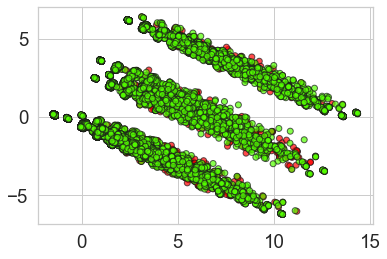

Resultado da prescisão 0.08469674151150054
Resultado do recall 0.4174433807093754
Resultado F1 0.14082162546683263
Resultado acurácia 0.6930328191755685
Sensibilidade:  0.4174433807093754
Especificação:  0.7107056698075446


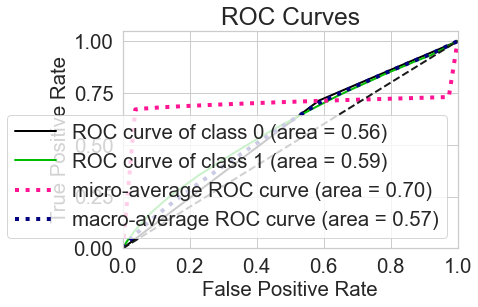

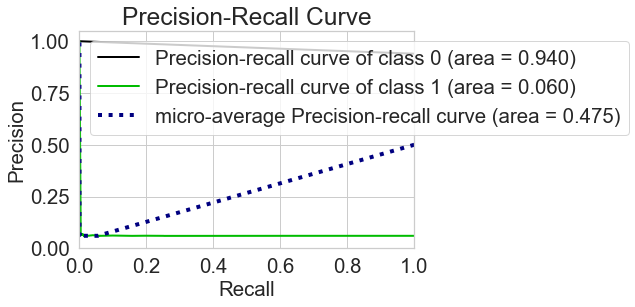

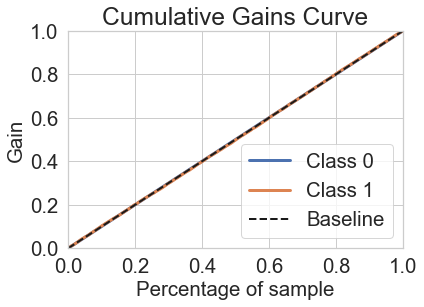

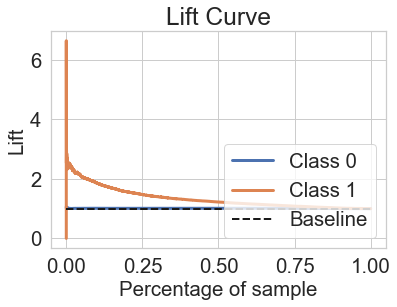

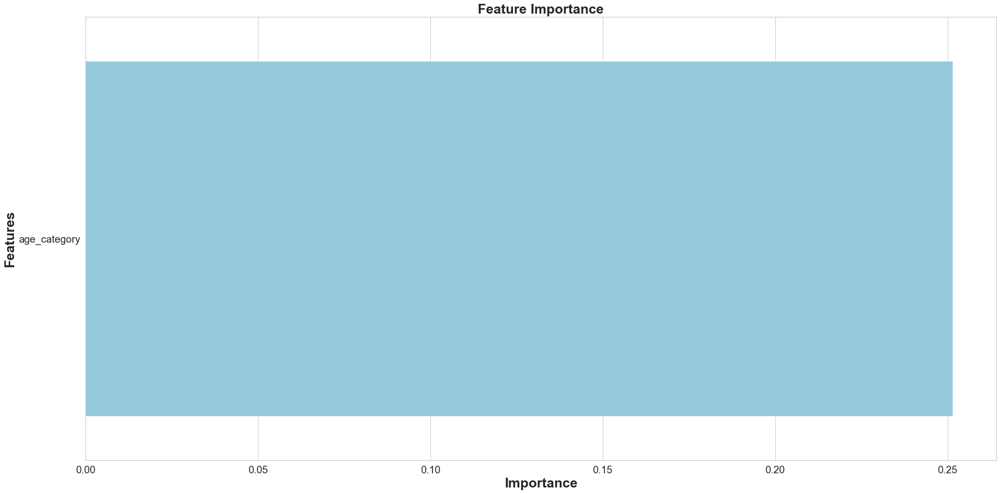

None

,Features,Gini-Importance
0,age_category,0.251529


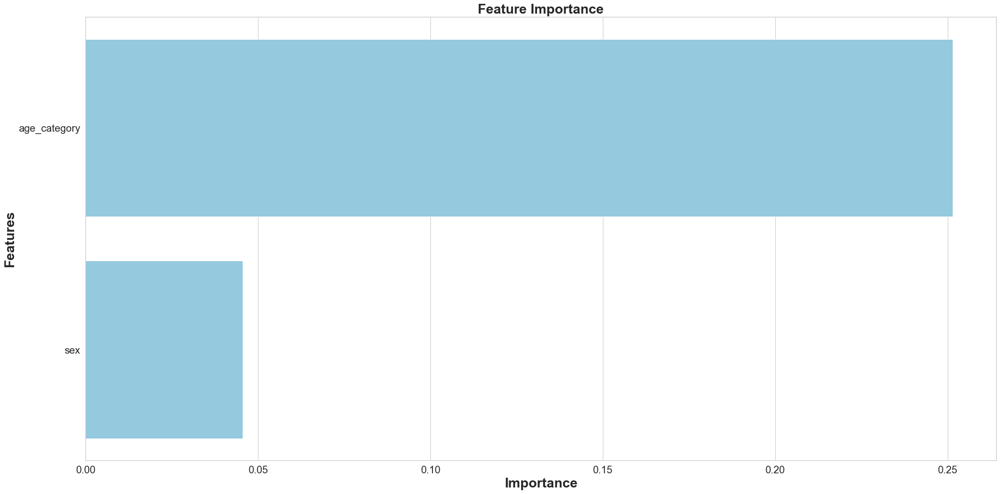

None

,Features,Gini-Importance
0,age_category,0.251529
1,sex,0.045610


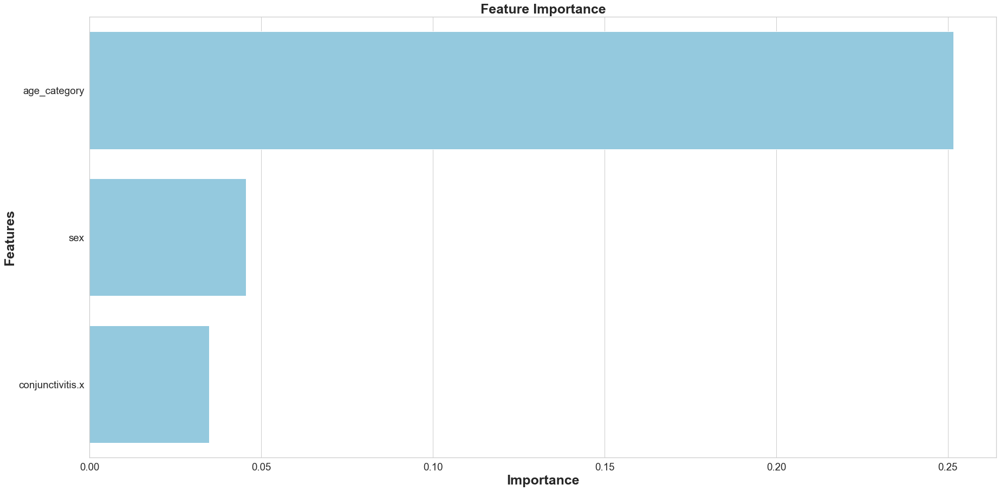

None

,Features,Gini-Importance
0,age_category,0.251529
1,sex,0.045610
2,conjunctivitis.x,0.034765


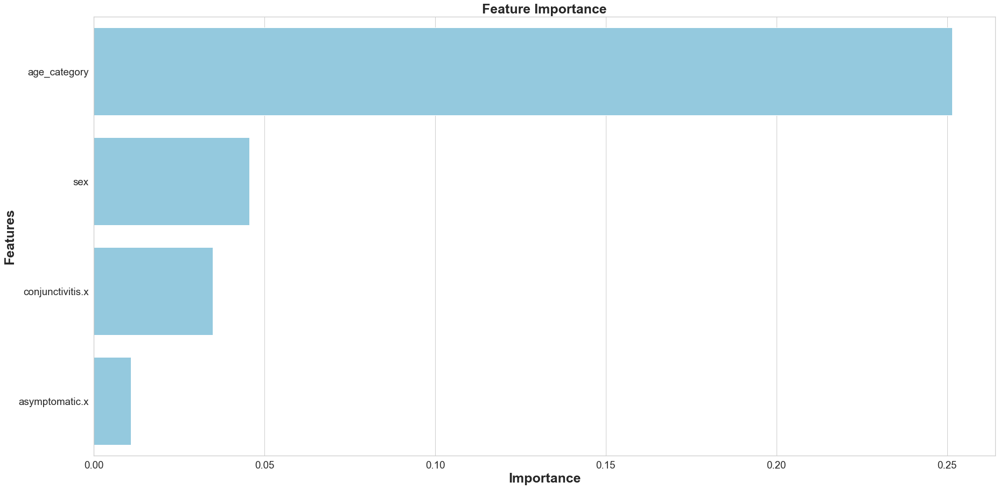

None

,Features,Gini-Importance
0,age_category,0.251529
1,sex,0.045610
2,conjunctivitis.x,0.034765
3,asymptomatic.x,0.010870


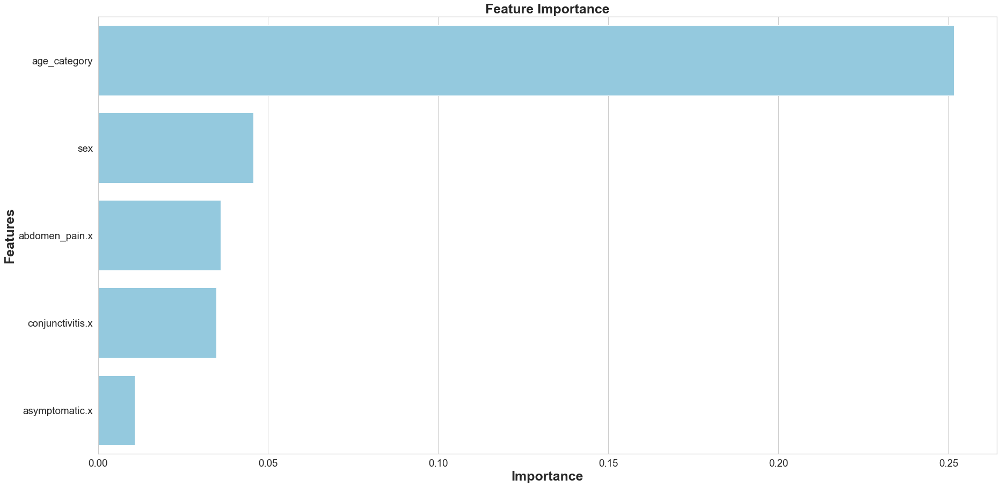

None

,Features,Gini-Importance
0,age_category,0.251529
1,sex,0.045610
2,abdomen_pain.x,0.036038
3,conjunctivitis.x,0.034765
4,asymptomatic.x,0.010870


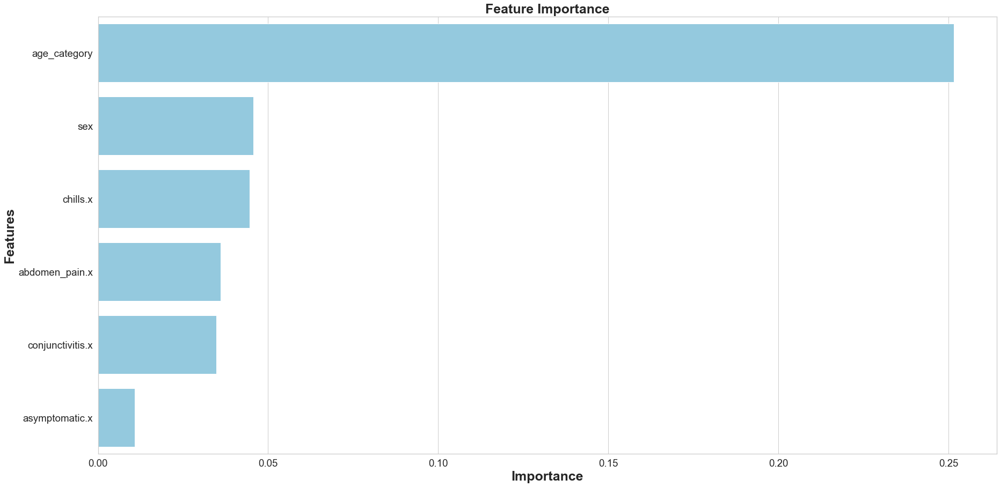

None

,Features,Gini-Importance
0,age_category,0.251529
1,sex,0.045610
2,chills.x,0.044492
3,abdomen_pain.x,0.036038
4,conjunctivitis.x,0.034765
5,asymptomatic.x,0.010870


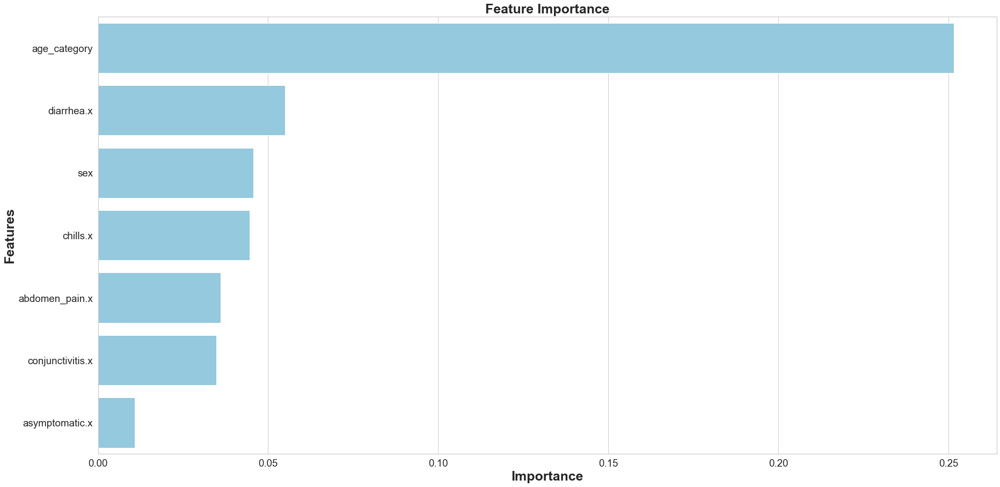

None

,Features,Gini-Importance
0,age_category,0.251529
1,diarrhea.x,0.054998
2,sex,0.045610
3,chills.x,0.044492
4,abdomen_pain.x,0.036038
5,conjunctivitis.x,0.034765
6,asymptomatic.x,0.010870


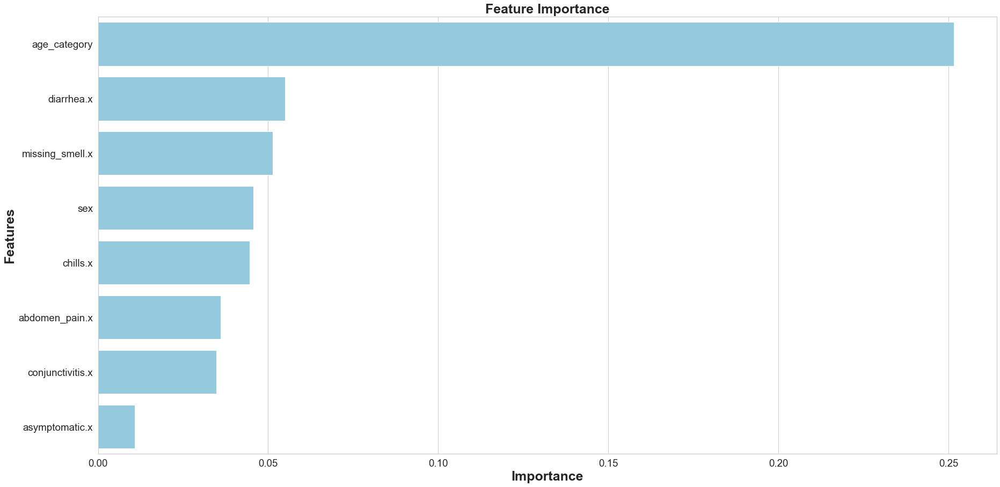

None

,Features,Gini-Importance
0,age_category,0.251529
1,diarrhea.x,0.054998
2,missing_smell.x,0.051312
3,sex,0.045610
4,chills.x,0.044492
5,abdomen_pain.x,0.036038
6,conjunctivitis.x,0.034765
7,asymptomatic.x,0.010870


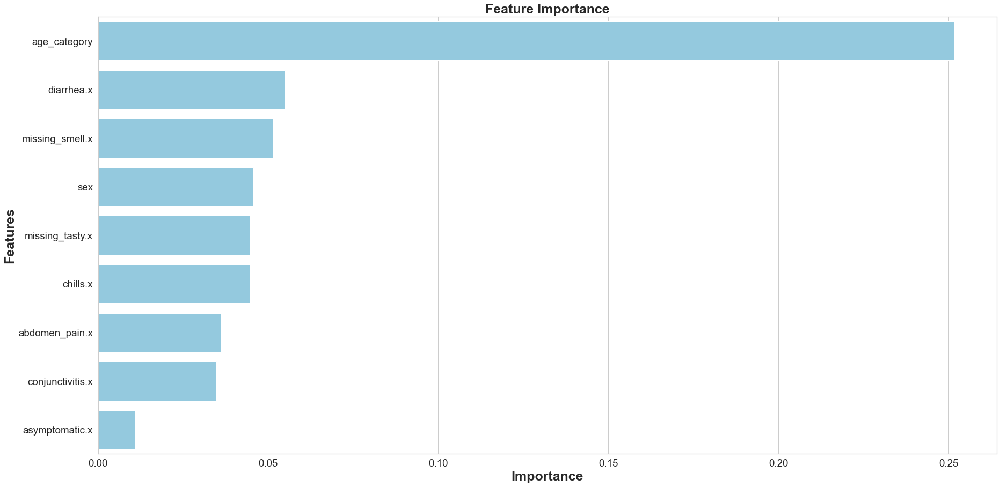

None

,Features,Gini-Importance
0,age_category,0.251529
1,diarrhea.x,0.054998
2,missing_smell.x,0.051312
3,sex,0.045610
4,missing_tasty.x,0.044650
5,chills.x,0.044492
6,abdomen_pain.x,0.036038
7,conjunctivitis.x,0.034765
8,asymptomatic.x,0.010870


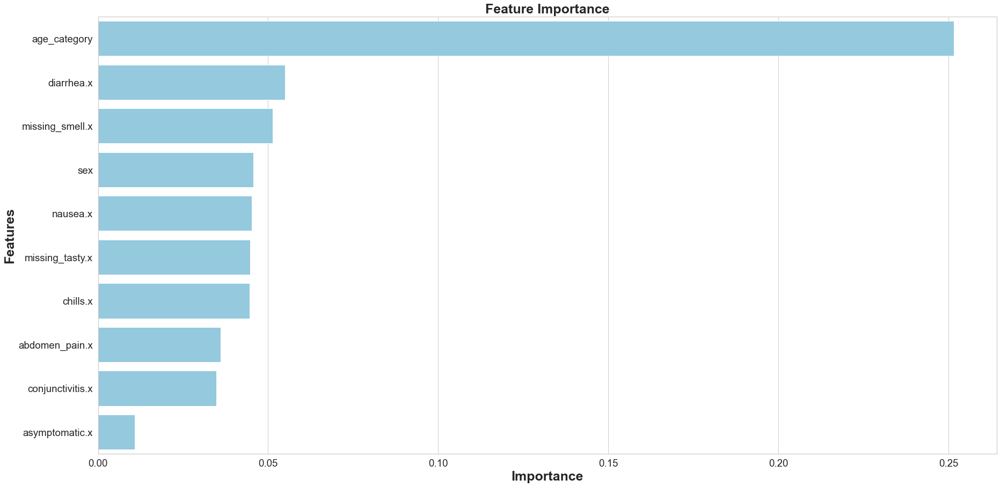

None

,Features,Gini-Importance
0,age_category,0.251529
1,diarrhea.x,0.054998
2,missing_smell.x,0.051312
3,sex,0.045610
4,nausea.x,0.045254
5,missing_tasty.x,0.044650
6,chills.x,0.044492
7,abdomen_pain.x,0.036038
8,conjunctivitis.x,0.034765
9,asymptomatic.x,0.010870


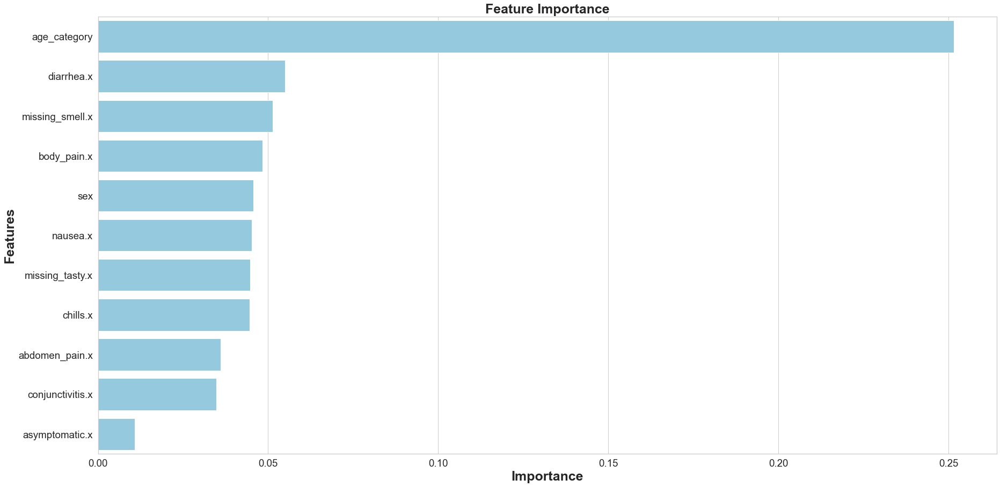

None

,Features,Gini-Importance
0,age_category,0.251529
1,diarrhea.x,0.054998
2,missing_smell.x,0.051312
3,body_pain.x,0.048405
4,sex,0.045610
5,nausea.x,0.045254
6,missing_tasty.x,0.044650
7,chills.x,0.044492
8,abdomen_pain.x,0.036038
9,conjunctivitis.x,0.034765


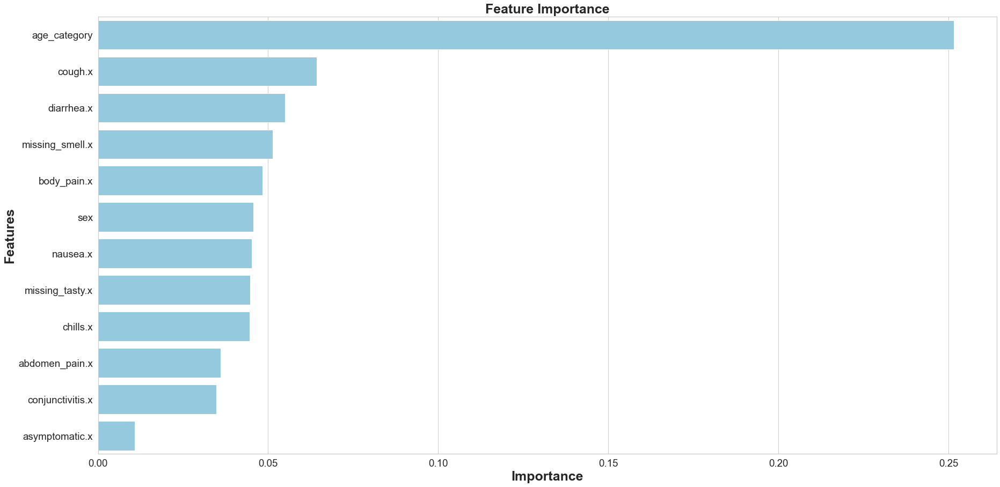

None

,Features,Gini-Importance
0,age_category,0.251529
1,cough.x,0.064327
2,diarrhea.x,0.054998
3,missing_smell.x,0.051312
4,body_pain.x,0.048405
5,sex,0.045610
6,nausea.x,0.045254
7,missing_tasty.x,0.044650
8,chills.x,0.044492
9,abdomen_pain.x,0.036038


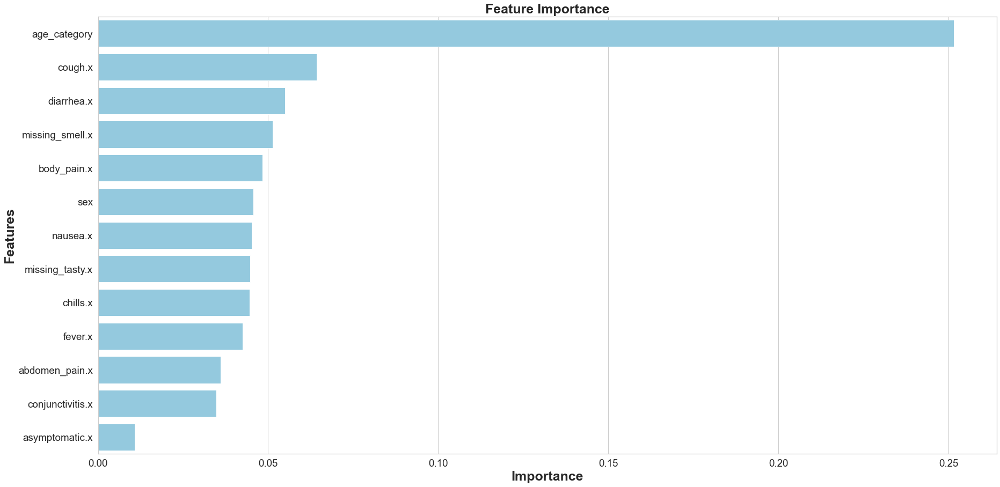

None

,Features,Gini-Importance
0,age_category,0.251529
1,cough.x,0.064327
2,diarrhea.x,0.054998
3,missing_smell.x,0.051312
4,body_pain.x,0.048405
5,sex,0.045610
6,nausea.x,0.045254
7,missing_tasty.x,0.044650
8,chills.x,0.044492
9,fever.x,0.042432


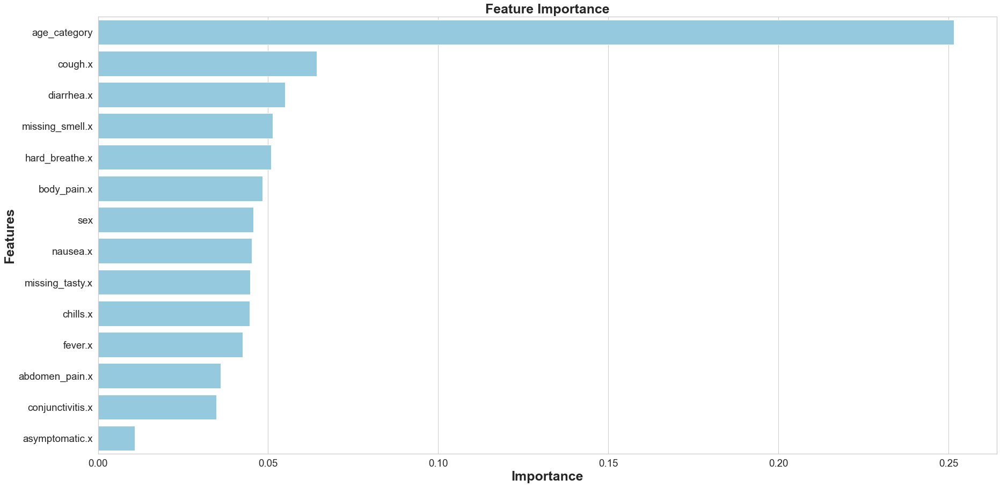

None

,Features,Gini-Importance
0,age_category,0.251529
1,cough.x,0.064327
2,diarrhea.x,0.054998
3,missing_smell.x,0.051312
4,hard_breathe.x,0.050909
5,body_pain.x,0.048405
6,sex,0.045610
7,nausea.x,0.045254
8,missing_tasty.x,0.044650
9,chills.x,0.044492


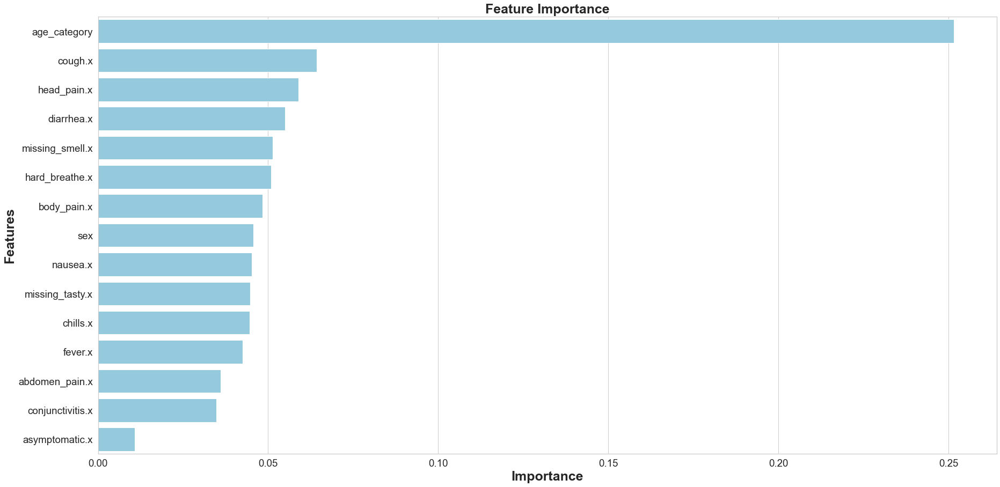

None

,Features,Gini-Importance
0,age_category,0.251529
1,cough.x,0.064327
2,head_pain.x,0.058867
3,diarrhea.x,0.054998
4,missing_smell.x,0.051312
5,hard_breathe.x,0.050909
6,body_pain.x,0.048405
7,sex,0.045610
8,nausea.x,0.045254
9,missing_tasty.x,0.044650


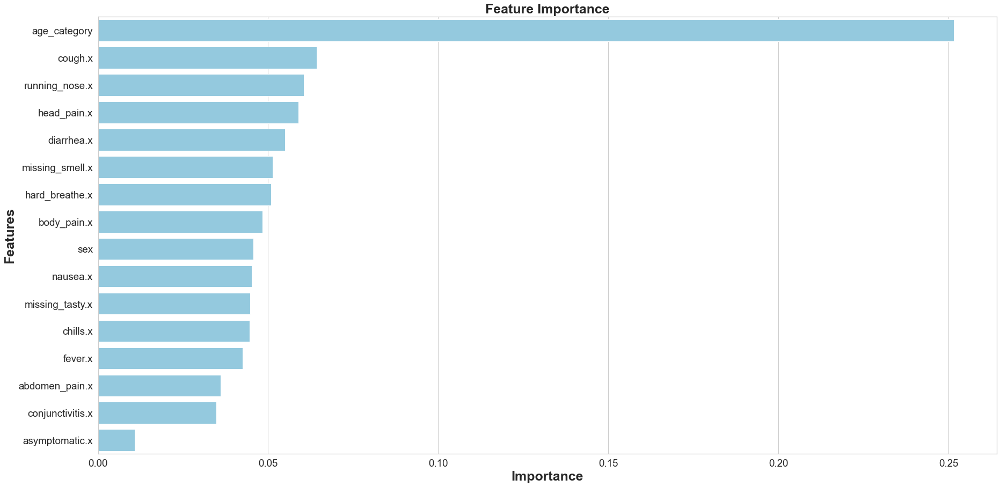

None

,Features,Gini-Importance
0,age_category,0.251529
1,cough.x,0.064327
2,running_nose.x,0.060450
3,head_pain.x,0.058867
4,diarrhea.x,0.054998
5,missing_smell.x,0.051312
6,hard_breathe.x,0.050909
7,body_pain.x,0.048405
8,sex,0.045610
9,nausea.x,0.045254


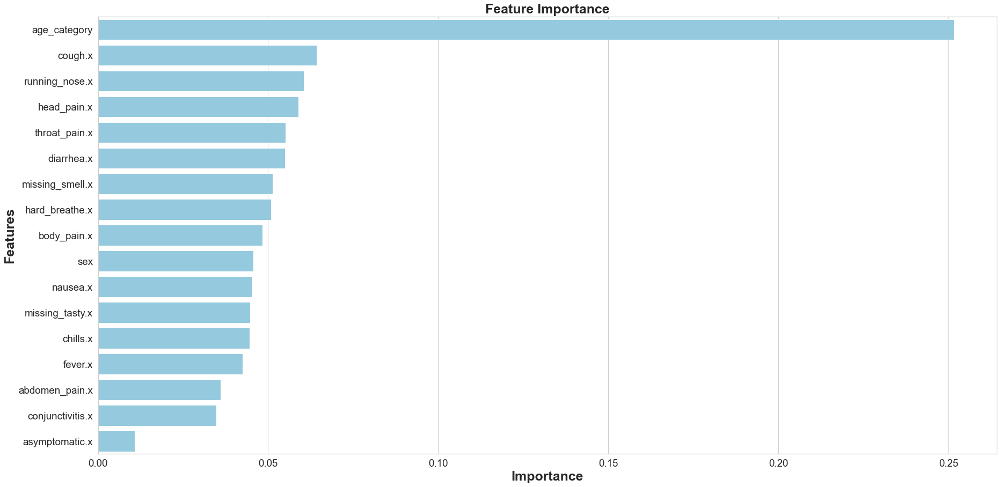

None

,Features,Gini-Importance
0,age_category,0.251529
1,cough.x,0.064327
2,running_nose.x,0.060450
3,head_pain.x,0.058867
4,throat_pain.x,0.055095
5,diarrhea.x,0.054998
6,missing_smell.x,0.051312
7,hard_breathe.x,0.050909
8,body_pain.x,0.048405
9,sex,0.045610


              precision    recall  f1-score   support

           0       0.95      0.71      0.81    369748
           1       0.08      0.42      0.14     23711

    accuracy                           0.69    393459
   macro avg       0.52      0.56      0.48    393459
weighted avg       0.90      0.69      0.77    393459

[[262782 106966]
 [ 13813   9898]]


In [176]:
roc_auc_rus1,fpr_rus1,tpr_rus1 , _ = build_and_test(X_res, X_test, y_res, y_test, class_weight = {0:1, 1:ratio}, threshold = True )

# LGT OVERSAMPLER Ajustes 🔱

In [177]:
from sklearn.linear_model import LogisticRegression

In [207]:

import scikitplot as skplt
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve, auc, roc_auc_score
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import PrecisionRecallDisplay
from sklearn.feature_selection import RFE
from numpy import argmax
import numpy as np

def build_and_test(X_tr, X_te, y_tr, y_te, class_weight =None, threshold=False, warm_start = False):
    
    # Construindo PCA
    pca = PCA(n_components=15)
    pca.fit(X_tr.tolist())
    X_pca = pca.transform(X_tr.tolist())

    plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_tr, cmap=plt.cm.prism, edgecolor='k', alpha=0.7)
    plt.show()
    
    # Construindo Modelo
    if class_weight:
        model = LogisticRegression(class_weight = class_weight)
    if warm_start:
        model = LogisticRegression(class_weight = class_weight , warm_start = bool, criterion='entropy')
    else:
        model = LogisticRegression()
    model.fit(X_tr, y_tr)
    
    # Teste do modelo
    y_pred = model.predict(X_te)
    print('Resultado da prescisão %s' % precision_score(y_te, y_pred))
    print('Resultado do recall %s' % recall_score(y_te, y_pred))
    print('Resultado F1 %s' % f1_score(y_te, y_pred))
    print('Resultado acurácia %s' % accuracy_score(y_te, y_pred))
    
 
    y_score = model.predict_proba(X_te)
    fpr0, tpr0, thresholds = roc_curve(y_te, y_score[:, 1])
    roc_auc0 = auc(fpr0, tpr0)
    cm1 = confusion_matrix(y_test, y_pred)
    total1 = sum(sum(cm1))
    sensi = cm1[0,0]/(cm1[0,0]+cm1[1,0])
    speci= cm1[1,1]/(cm1[0,1]+cm1[1,1])
    print(cm1[0,0])
    print(cm1[0,1])
    print(cm1[1,0])
    print(cm1[1,1])

    sensi = cm1[1,1]/(cm1[1,1]+cm1[1,0])
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    print('Sensibilidade:  %s' % sensi)
    print('Especificação:  %s' % speci)

    # Calculando o melhor threashold
    best_threshold = None
    if threshold:
        J = tpr0 - fpr0
        ix = argmax(J) # valor da maior estatística 
        best_threshold = thresholds[ix]
        # ajuste de acordo com o threshold.
        y_score = np.array([[1, y[1]] if y[0] >= best_threshold else [0, y[1]] for y in y_score])

    # importance
    importance = model.coef_[0]
    # summarize
    for i,v in enumerate(importance):
	    print('Feature: %0d, Score: %.5f' % (i,v))

        
    # Plot 
    plot_roc(y_te, y_score)
    plt.show() 
       
    plot_precision_recall(y_te, y_score1)
    plt.show()
    
    plot_cumulative_gain(y_te, y_score1)
    plt.show()
    
    plot_lift_curve(y_te, y_score)
    plt.show()

    # plot feature importance
    plt.bar([x for x in range(len(importance))], importance)
    plt.show()
    
    # Print
    print(classification_report(y_te,y_pred))
    print(confusion_matrix(y_test, y_pred))
    return roc_auc0,fpr0,tpr0, best_threshold

In [204]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33)

In [205]:
from imblearn.over_sampling import RandomOverSampler
over_sampler = RandomOverSampler(random_state=42)
X_res, y_res = over_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 750682, 1: 750682})
Testing target statistics: Counter({0: 369958, 1: 23501})


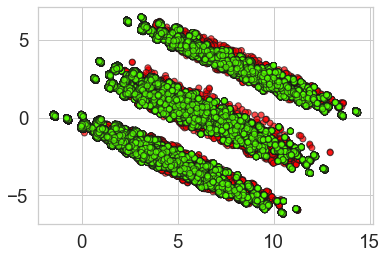

Resultado da prescisão 0.08682576639503298
Resultado do recall 0.4570018297093741
Resultado F1 0.14592688709688376
Resultado acurácia 0.6804825915787922
257002
112956
12761
10740
Sensibilidade:  0.4570018297093741
Especificação:  0.6946788554376443
Feature: 0, Score: 0.21302
Feature: 1, Score: -0.07975
Feature: 2, Score: -0.06500
Feature: 3, Score: -0.09363
Feature: 4, Score: 0.00564
Feature: 5, Score: 0.02820
Feature: 6, Score: 0.00272
Feature: 7, Score: 0.11492
Feature: 8, Score: 0.10265
Feature: 9, Score: 0.00571
Feature: 10, Score: 0.03877
Feature: 11, Score: 0.01075
Feature: 12, Score: 0.06808
Feature: 13, Score: 0.02387
Feature: 14, Score: -0.03572
Feature: 15, Score: -0.04486
Feature: 16, Score: -0.06901


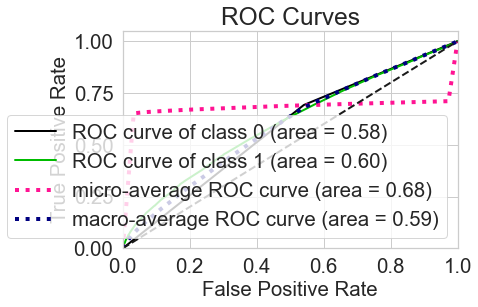

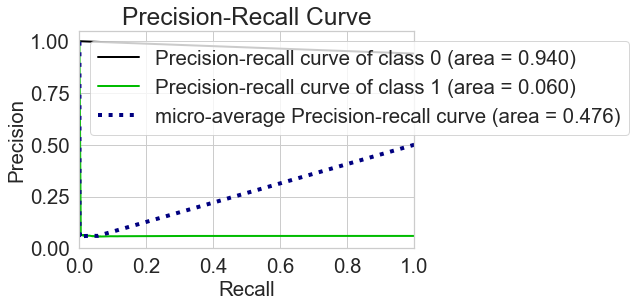

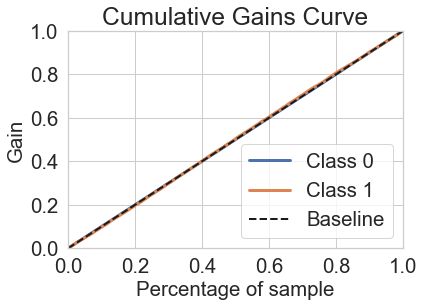

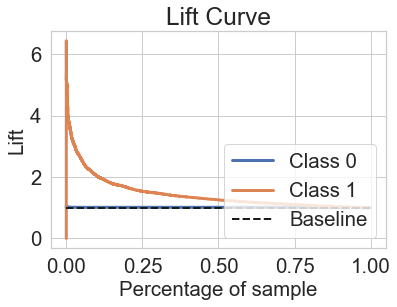

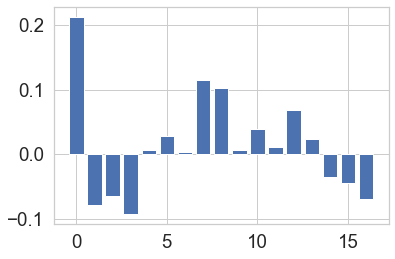

              precision    recall  f1-score   support

           0       0.95      0.69      0.80    369958
           1       0.09      0.46      0.15     23501

    accuracy                           0.68    393459
   macro avg       0.52      0.58      0.47    393459
weighted avg       0.90      0.68      0.76    393459

[[257002 112956]
 [ 12761  10740]]


In [208]:
roc_auc_ros2,fpr_ros2,tpr_ros2, _ = build_and_test(X_res, X_test, y_res, y_test, class_weight = {0:1, 1:ratio}, threshold = True)

In [ ]:
df1.columns

Index(['age_category', 'sex', 'conjunctivitis.x', 'asymptomatic.x',
       'abdomen_pain.x', 'chills.x', 'diarrhea.x', 'missing_smell.x',
       'missing_tasty.x', 'nausea.x', 'body_pain.x', 'cough.x', 'fever.x',
       'hard_breathe.x', 'head_pain.x', 'running_nose.x', 'throat_pain.x'],
      dtype='object')

# DECISION TREE UNDERSAMPLER Ajustes 🔱

In [220]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve, auc, roc_auc_score
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report

from scikitplot.metrics import plot_roc
from scikitplot.metrics import plot_precision_recall
from scikitplot.metrics import plot_cumulative_gain
from scikitplot.metrics import plot_lift_curve

from numpy import argmax
import numpy as np

def build_and_test(X_tr, X_te, y_tr, y_te, class_weight=None, threshold=False, warm_start=False):
    
    # PCA
    pca = PCA(n_components=2)
    pca.fit(X_tr.tolist())
    X_pca = pca.transform(X_tr.tolist())

    plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_tr, cmap=plt.cm.prism, edgecolor='k', alpha=0.7)
    plt.show()
    
    # construindo modelo
    if class_weight:
        model = DecisionTreeClassifier(class_weight = class_weight)
    if warm_start:
        model = DecisionTreeClassifier(class_weight = class_weight , warm_start = bool, criterion='entropy')
    else:
        model = DecisionTreeClassifier()
    model.fit(X_tr, y_tr)
    
    # modelo
    y_pred = model.predict(X_te)
    print('Precision score %s' % precision_score(y_te, y_pred))
    print('Recall score %s' % recall_score(y_te, y_pred))
    print('F1-score score %s' % f1_score(y_te, y_pred))
    print('Accuracy score %s' % accuracy_score(y_te, y_pred))
    
    y_score = model.predict_proba(X_te)
    fpr0, tpr0, thresholds = roc_curve(y_te, y_score[:, 1])
    roc_auc0 = auc(fpr0, tpr0)
    cm1 = confusion_matrix(y_test, y_pred)
    total1 = sum(sum(cm1))
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    print('Sensibilidade:  %s' % sensi)
    print('Especificação:  %s' % speci)
    
    # o melhor threshold
    best_threshold = None
    if threshold:
        J = tpr0 - fpr0
        ix = argmax(J) # valores que maximizam a estatística J
        best_threshold = thresholds[ix]
        # ajuste de score de acordo com threshold.
        y_score = np.array([[1, y[1]] if y[0] >= best_threshold else [0, y[1]] for y in y_score])
    
    #importance
    importance = model.feature_importances_
    # summarize feature importance
    for i,v in enumerate(importance):
        print('Feature: %0d, Score: %.5f' % (i,v))
    # plot feature importance
    plt.bar([x for x in range(len(importance))], importance)
    plt.show()
        
    
    # Plot
    plot_roc(y_te, y_score)
    plt.show()
    
    plot_precision_recall(y_te, y_score)
    plt.show()
    
    plot_cumulative_gain(y_te, y_score)
    plt.show()
    
    plot_lift_curve(y_te, y_score)
    plt.show()
    
    # Print
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_te,y_pred))
    return roc_auc0,fpr0,tpr0, best_threshold

In [211]:
from imblearn.under_sampling import RandomUnderSampler

under_sampler = RandomUnderSampler(random_state=42)
X_res, y_res = under_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 48156, 1: 48156})
Testing target statistics: Counter({0: 369958, 1: 23501})


In [185]:
ratio

15

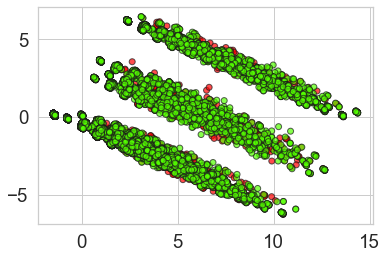

Precision score 0.07890519838471893
Recall score 0.47142674779796606
F1-score score 0.1351839424074187
Accuracy score 0.6397286629610709
Sensibilidade:  0.47142674779796606
Especificação:  0.650419777380135
Feature: 0, Score: 0.15698
Feature: 1, Score: 0.03896
Feature: 2, Score: 0.03412
Feature: 3, Score: 0.00895
Feature: 4, Score: 0.04823
Feature: 5, Score: 0.05750
Feature: 6, Score: 0.06413
Feature: 7, Score: 0.11264
Feature: 8, Score: 0.03154
Feature: 9, Score: 0.05300
Feature: 10, Score: 0.05008
Feature: 11, Score: 0.05595
Feature: 12, Score: 0.05377
Feature: 13, Score: 0.06350
Feature: 14, Score: 0.06757
Feature: 15, Score: 0.05690
Feature: 16, Score: 0.04619


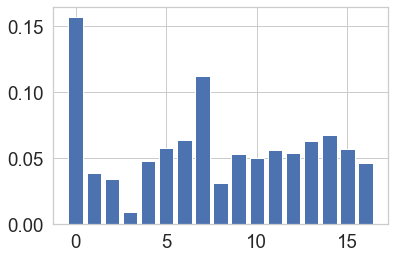

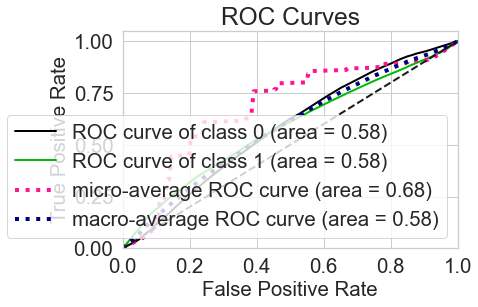

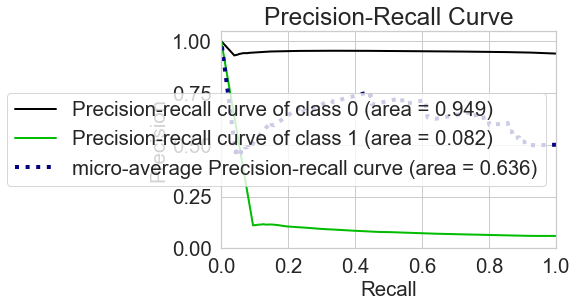

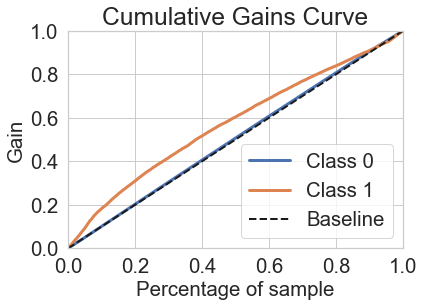

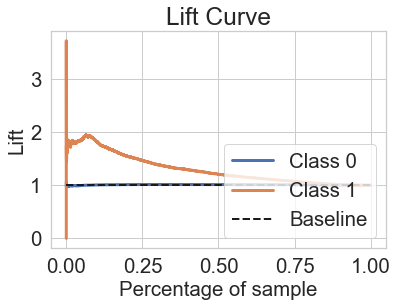

[[240628 129330]
 [ 12422  11079]]
              precision    recall  f1-score   support

           0       0.95      0.65      0.77    369958
           1       0.08      0.47      0.14     23501

    accuracy                           0.64    393459
   macro avg       0.51      0.56      0.45    393459
weighted avg       0.90      0.64      0.73    393459



In [221]:
roc_auc_rus3,fpr_rus3,tpr_rus3 , _ = build_and_test(X_res, X_test, y_res, y_test)

# RANDOM FOREST NEAR MISS Ajustes 🔱

In [199]:
import scikitplot as skplt
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve, auc, roc_auc_score

import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import PrecisionRecallDisplay
from numpy import argmax
import numpy as np

def build_and_test(X_tr, X_te, y_tr, y_te, class_weight=None, threshold=False, warm_start = False):
    
    # Construindo PCA
    pca = PCA(n_components=15)
    pca.fit(X_tr.tolist())
    X_pca = pca.transform(X_tr.tolist())

    plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_tr, cmap=plt.cm.prism, edgecolor='k', alpha=0.7)
    plt.show()
    
    # Construindo Modelo
    if class_weight:
        model = RandomForestClassifier(class_weight = class_weight , criterion='entropy'),
    if warm_start:
        model = RandomForestClassifier(class_weight = class_weight , warm_start = bool, criterion='entropy')
    else:
        model = RandomForestClassifier(criterion='entropy')
    model.fit(X_tr, y_tr)
    
    # Teste do modelo
    y_pred = model.predict(X_te)
    print('Resultado da prescisão %s' % precision_score(y_te, y_pred))
    print('Resultado do recall %s' % recall_score(y_te, y_pred))
    print('Resultado F1 %s' % f1_score(y_te, y_pred))
    print('Resultado acurácia %s' % accuracy_score(y_te, y_pred))
    
    y_score = model.predict_proba(X_te)
    fpr0, tpr0, thresholds = roc_curve(y_te, y_score[:, 1])
    roc_auc0 = auc(fpr0, tpr0)
    cm1 = confusion_matrix(y_test, y_pred)
    total1 = sum(sum(cm1))
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])

    features1 =  model.feature_importances_

    print('Sensibilidade:  %s' % sensi)
    print('Especificação:  %s' % speci)
    # Calculando o melhor threashold
    best_threshold = None
    if threshold:
        J = tpr0 - fpr0
        ix = argmax(J) # valor da maior estatística 
        best_threshold = thresholds[ix]
        # ajuste de acordo com o threshold.
        y_score = np.array([[1, y[1]] if y[0] >= best_threshold else [0, y[1]] for y in y_score])
        
    # Plot 
    plot_roc(y_te, y_score)
    plt.show()
    
    plot_precision_recall(y_te, y_score1)
    plt.show()
    
    plot_cumulative_gain(y_te, y_score1)
    plt.show()
    
    plot_lift_curve(y_te, y_score)
    plt.show()

    feats = {}
    for feature, importance in zip(df1.columns, features1):
        feats[feature] = importance
        importances = pd.DataFrame.from_dict(feats, orient='index').rename(columns={0: 'Gini-Importance'})
        importances = importances.sort_values(by='Gini-Importance', ascending=False)
        importances = importances.reset_index()
        importances = importances.rename(columns={'index': 'Features'})
        sns.set(font_scale = 5)
        sns.set(style="whitegrid", color_codes=True, font_scale = 1.7)
        fig, ax = plt.subplots()
        fig.set_size_inches(30,15)
        sns.barplot(x=importances['Gini-Importance'], y=importances['Features'], data=importances, color='skyblue')
        plt.xlabel('Importance', fontsize=25, weight = 'bold')
        plt.ylabel('Features', fontsize=25, weight = 'bold')
        plt.title('Feature Importance', fontsize=25, weight = 'bold')
        display(plt.show())
        display(importances)
    
    # Print
    print(classification_report(y_te,y_pred))
    print(confusion_matrix(y_test, y_pred))
    return roc_auc0,fpr0,tpr0, best_threshold

In [200]:
from imblearn.under_sampling import NearMiss
under_sampler = NearMiss()
X_res, y_res = under_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 48151, 1: 48151})
Testing target statistics: Counter({0: 369953, 1: 23506})


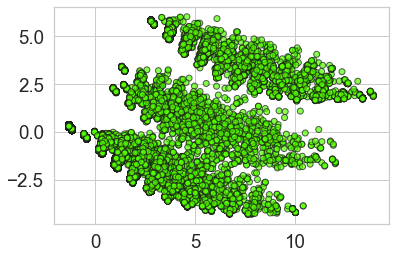

Resultado da prescisão 0.06379546048531393
Resultado do recall 0.5399897898408916
Resultado F1 0.11410976760911584
Resultado acurácia 0.49909901667009776
Sensibilidade:  0.5399897898408916
Especificação:  0.49650090687195403


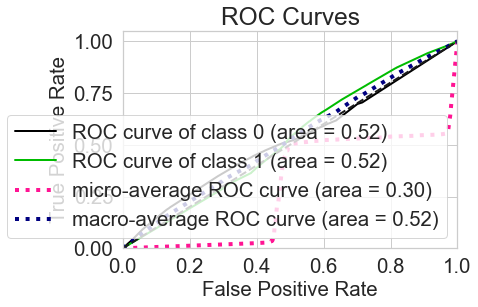

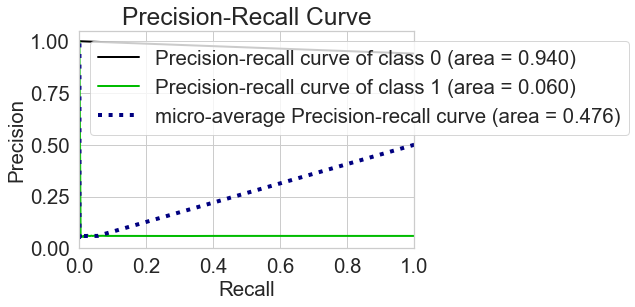

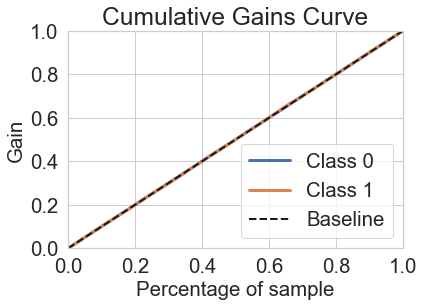

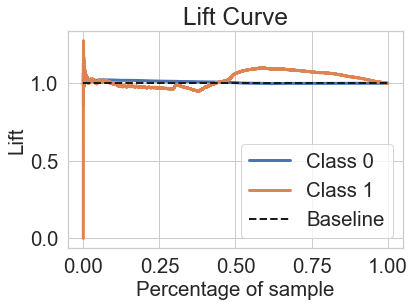

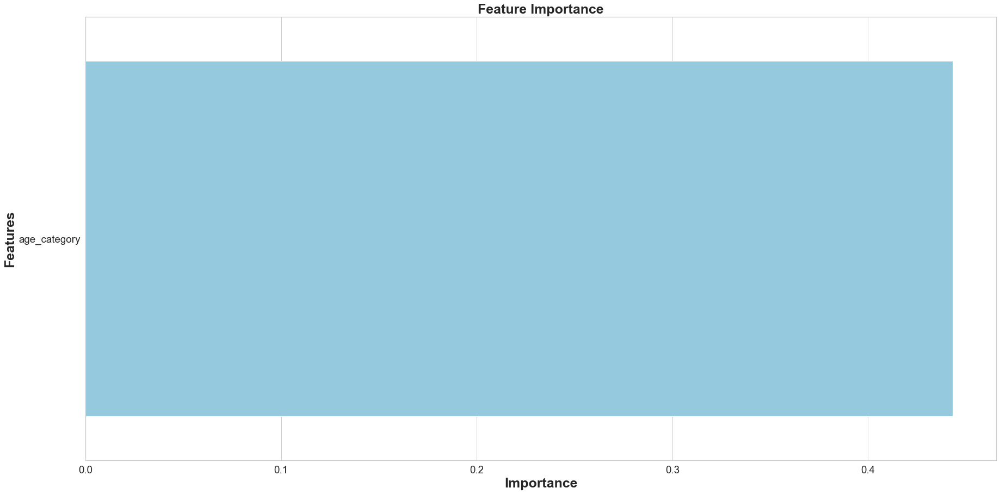

None

,Features,Gini-Importance
0,age_category,0.443389


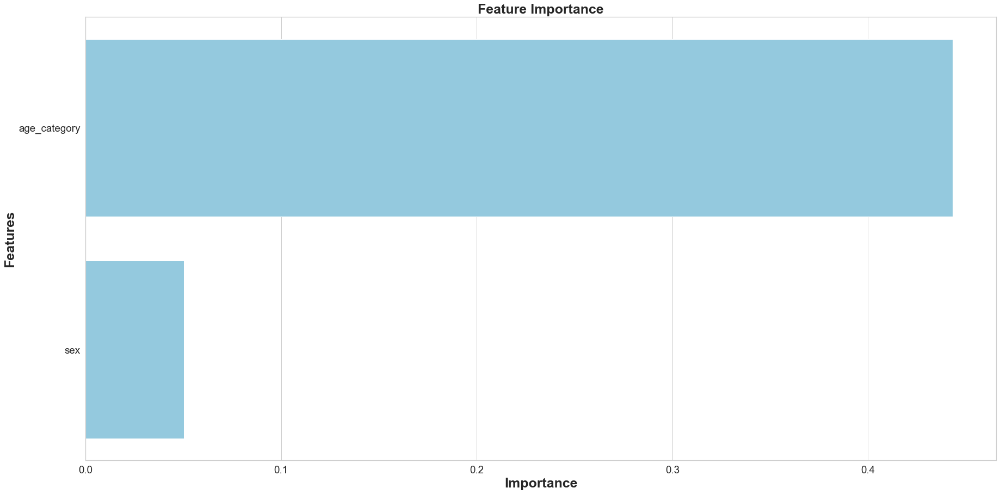

None

,Features,Gini-Importance
0,age_category,0.443389
1,sex,0.050393


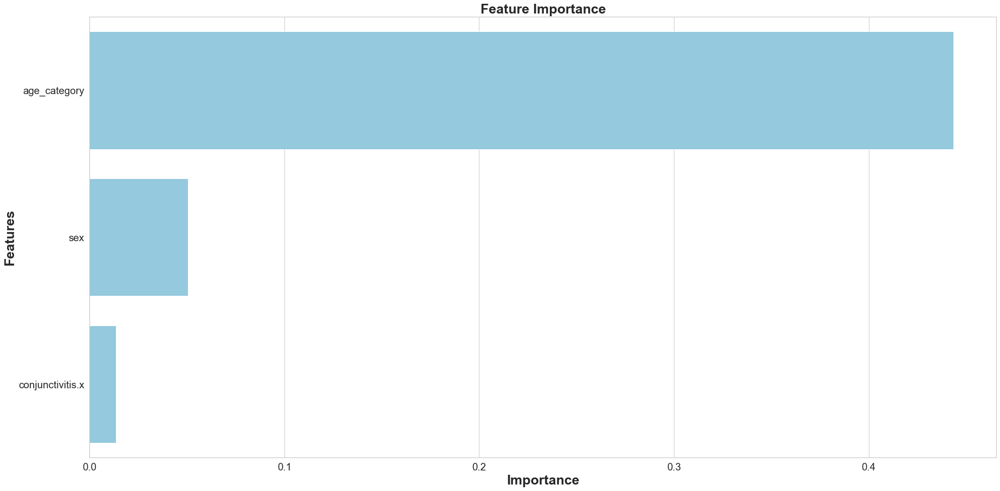

None

,Features,Gini-Importance
0,age_category,0.443389
1,sex,0.050393
2,conjunctivitis.x,0.013593


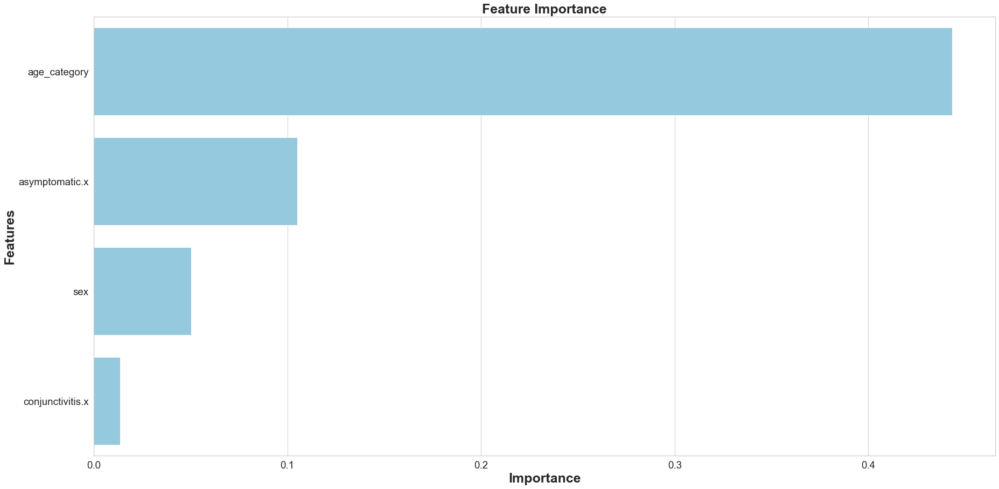

None

,Features,Gini-Importance
0,age_category,0.443389
1,asymptomatic.x,0.105075
2,sex,0.050393
3,conjunctivitis.x,0.013593


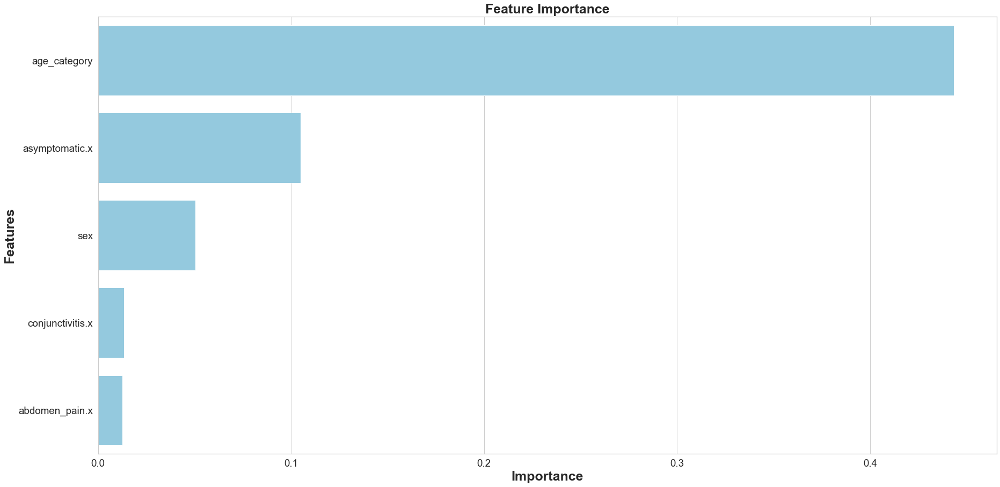

None

,Features,Gini-Importance
0,age_category,0.443389
1,asymptomatic.x,0.105075
2,sex,0.050393
3,conjunctivitis.x,0.013593
4,abdomen_pain.x,0.012553


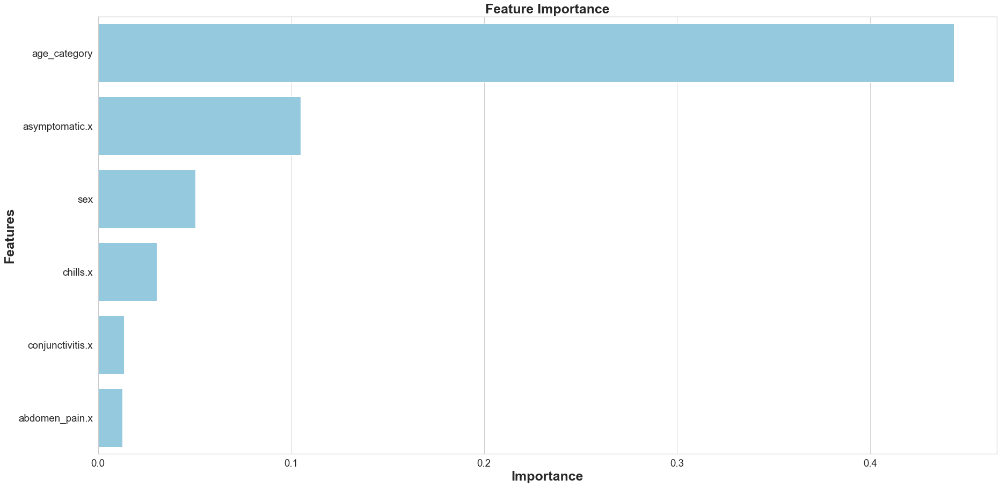

None

,Features,Gini-Importance
0,age_category,0.443389
1,asymptomatic.x,0.105075
2,sex,0.050393
3,chills.x,0.030389
4,conjunctivitis.x,0.013593
5,abdomen_pain.x,0.012553


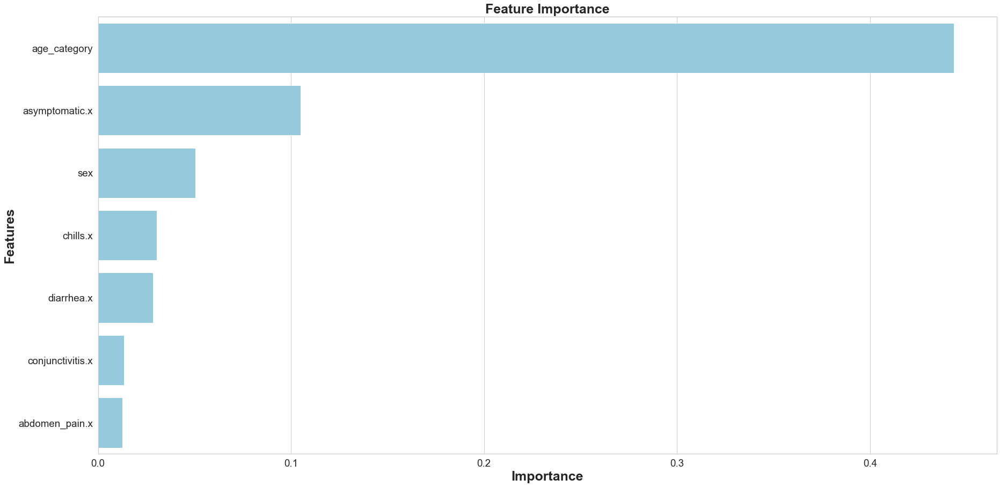

None

,Features,Gini-Importance
0,age_category,0.443389
1,asymptomatic.x,0.105075
2,sex,0.050393
3,chills.x,0.030389
4,diarrhea.x,0.028487
5,conjunctivitis.x,0.013593
6,abdomen_pain.x,0.012553


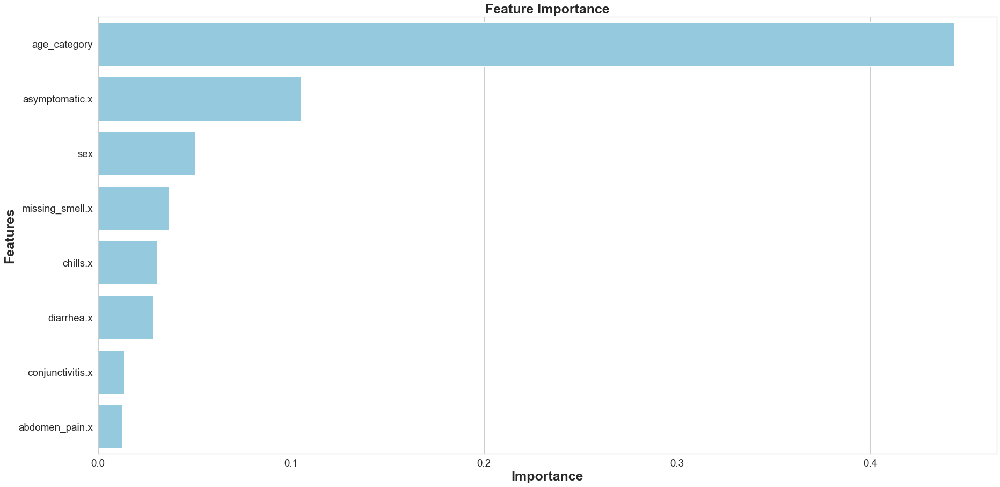

None

,Features,Gini-Importance
0,age_category,0.443389
1,asymptomatic.x,0.105075
2,sex,0.050393
3,missing_smell.x,0.036849
4,chills.x,0.030389
5,diarrhea.x,0.028487
6,conjunctivitis.x,0.013593
7,abdomen_pain.x,0.012553


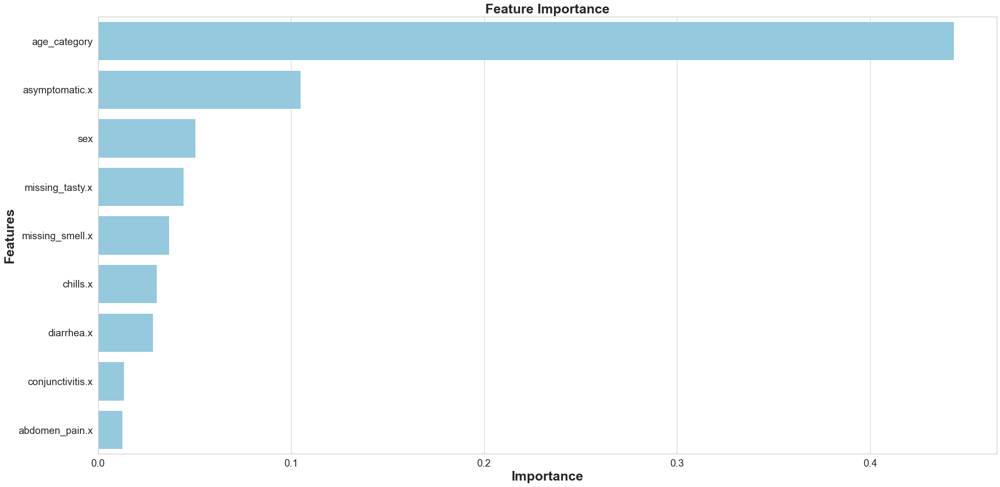

None

,Features,Gini-Importance
0,age_category,0.443389
1,asymptomatic.x,0.105075
2,sex,0.050393
3,missing_tasty.x,0.044336
4,missing_smell.x,0.036849
5,chills.x,0.030389
6,diarrhea.x,0.028487
7,conjunctivitis.x,0.013593
8,abdomen_pain.x,0.012553


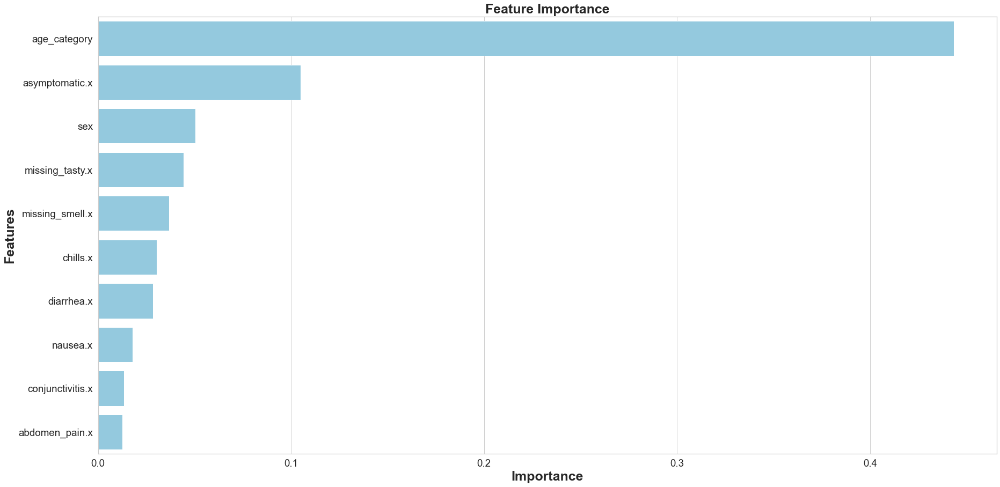

None

,Features,Gini-Importance
0,age_category,0.443389
1,asymptomatic.x,0.105075
2,sex,0.050393
3,missing_tasty.x,0.044336
4,missing_smell.x,0.036849
5,chills.x,0.030389
6,diarrhea.x,0.028487
7,nausea.x,0.017993
8,conjunctivitis.x,0.013593
9,abdomen_pain.x,0.012553


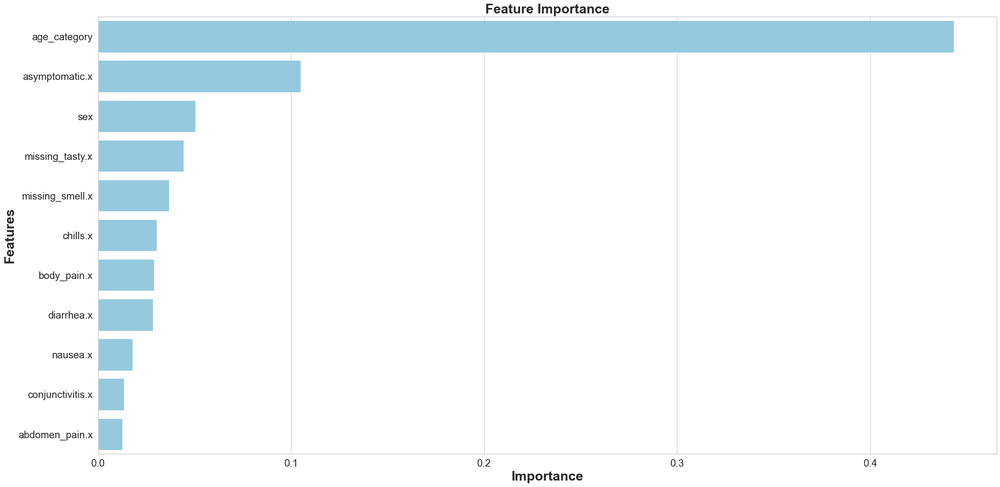

None

,Features,Gini-Importance
0,age_category,0.443389
1,asymptomatic.x,0.105075
2,sex,0.050393
3,missing_tasty.x,0.044336
4,missing_smell.x,0.036849
5,chills.x,0.030389
6,body_pain.x,0.029113
7,diarrhea.x,0.028487
8,nausea.x,0.017993
9,conjunctivitis.x,0.013593


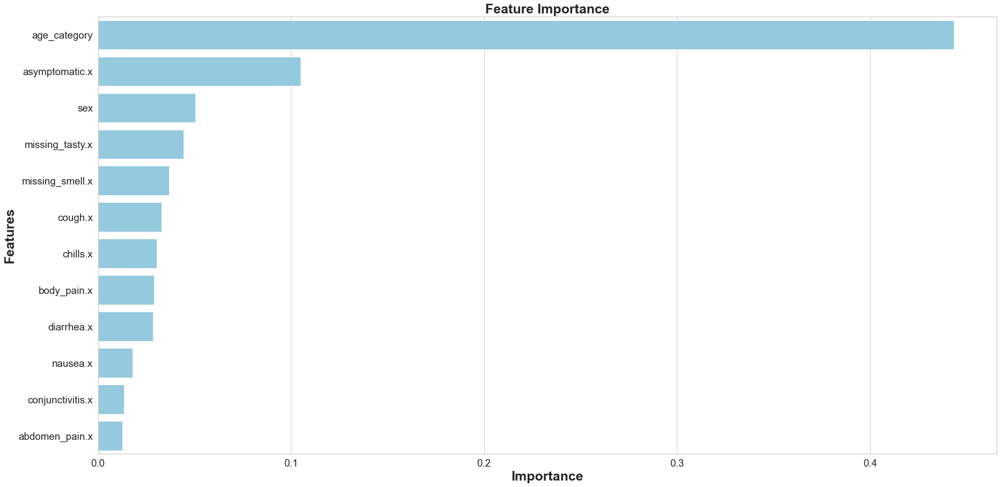

None

,Features,Gini-Importance
0,age_category,0.443389
1,asymptomatic.x,0.105075
2,sex,0.050393
3,missing_tasty.x,0.044336
4,missing_smell.x,0.036849
5,cough.x,0.033052
6,chills.x,0.030389
7,body_pain.x,0.029113
8,diarrhea.x,0.028487
9,nausea.x,0.017993


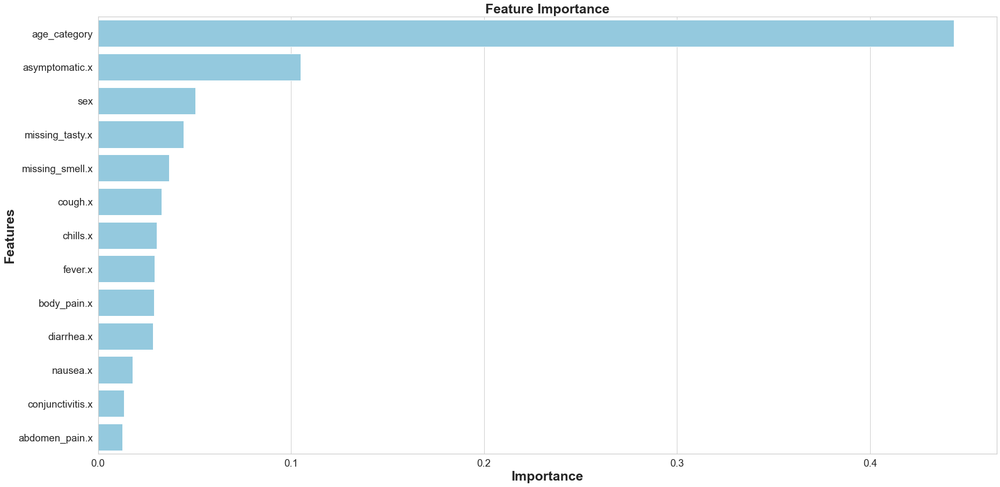

None

,Features,Gini-Importance
0,age_category,0.443389
1,asymptomatic.x,0.105075
2,sex,0.050393
3,missing_tasty.x,0.044336
4,missing_smell.x,0.036849
5,cough.x,0.033052
6,chills.x,0.030389
7,fever.x,0.029306
8,body_pain.x,0.029113
9,diarrhea.x,0.028487


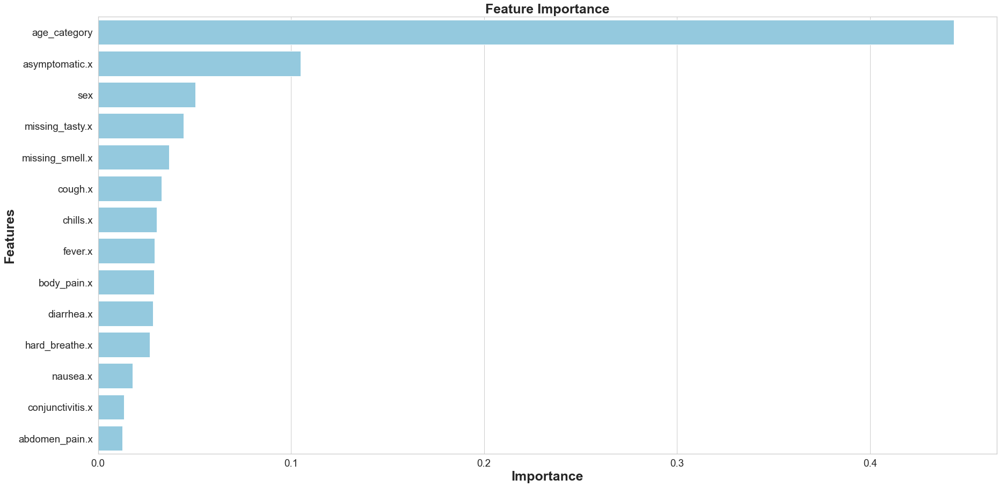

None

,Features,Gini-Importance
0,age_category,0.443389
1,asymptomatic.x,0.105075
2,sex,0.050393
3,missing_tasty.x,0.044336
4,missing_smell.x,0.036849
5,cough.x,0.033052
6,chills.x,0.030389
7,fever.x,0.029306
8,body_pain.x,0.029113
9,diarrhea.x,0.028487


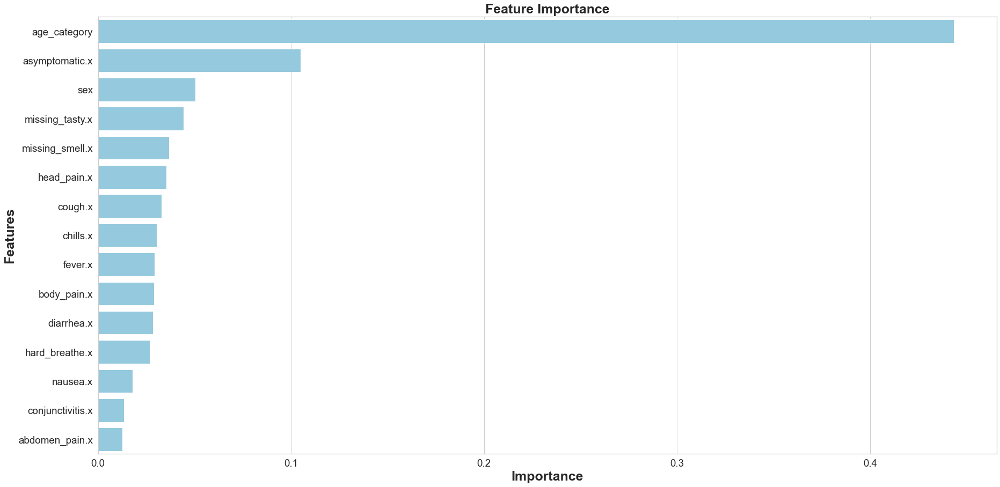

None

,Features,Gini-Importance
0,age_category,0.443389
1,asymptomatic.x,0.105075
2,sex,0.050393
3,missing_tasty.x,0.044336
4,missing_smell.x,0.036849
5,head_pain.x,0.035412
6,cough.x,0.033052
7,chills.x,0.030389
8,fever.x,0.029306
9,body_pain.x,0.029113


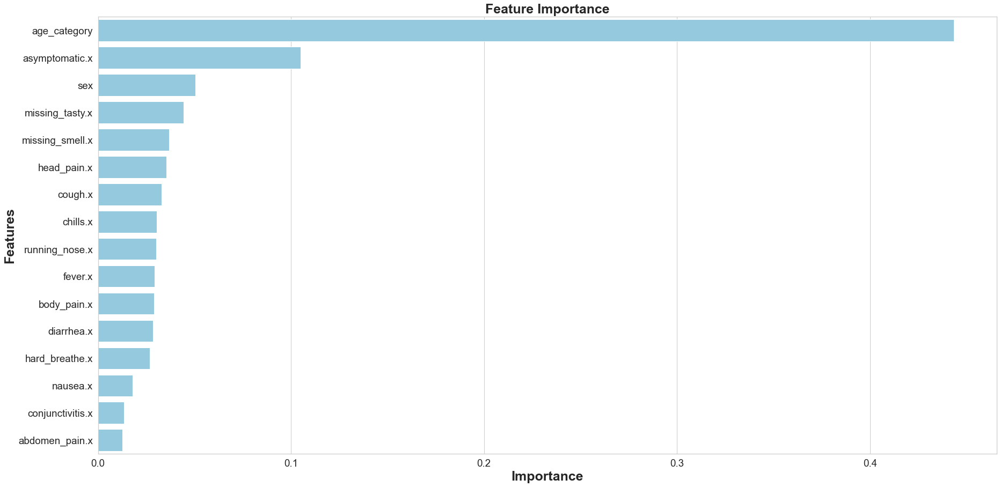

None

,Features,Gini-Importance
0,age_category,0.443389
1,asymptomatic.x,0.105075
2,sex,0.050393
3,missing_tasty.x,0.044336
4,missing_smell.x,0.036849
5,head_pain.x,0.035412
6,cough.x,0.033052
7,chills.x,0.030389
8,running_nose.x,0.030071
9,fever.x,0.029306


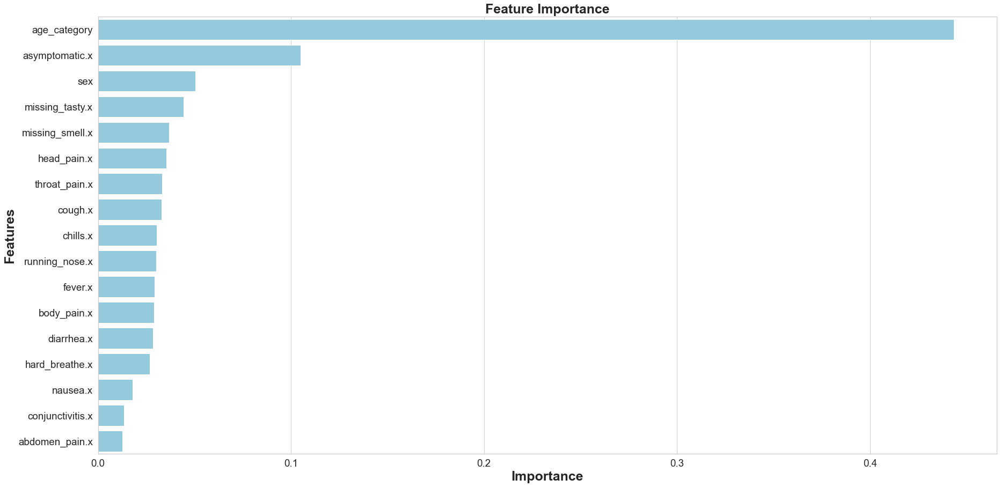

None

,Features,Gini-Importance
0,age_category,0.443389
1,asymptomatic.x,0.105075
2,sex,0.050393
3,missing_tasty.x,0.044336
4,missing_smell.x,0.036849
5,head_pain.x,0.035412
6,throat_pain.x,0.033300
7,cough.x,0.033052
8,chills.x,0.030389
9,running_nose.x,0.030071


              precision    recall  f1-score   support

           0       0.94      0.50      0.65    369953
           1       0.06      0.54      0.11     23506

    accuracy                           0.50    393459
   macro avg       0.50      0.52      0.38    393459
weighted avg       0.89      0.50      0.62    393459

[[183682 186271]
 [ 10813  12693]]


In [201]:
roc_auc_nm1,fpr_nm1,tpr_nm1, _  = build_and_test(X_res, X_test, y_res, y_test)

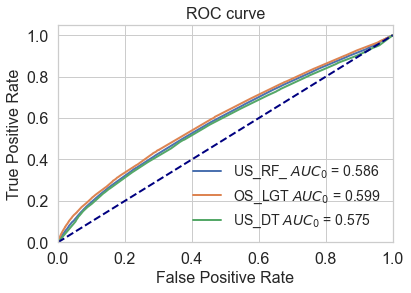

In [190]:
plt.plot(fpr_rus1, tpr_rus1, lw=2, label='US_RF_ $AUC_0$ = %.3f' % (roc_auc_rus1))
plt.plot(fpr_ros2, tpr_ros2, lw=2, label='OS_LGT $AUC_0$ = %.3f' % (roc_auc_ros2))
plt.plot(fpr_rus3, tpr_rus3, lw=2, label='US_DT $AUC_0$ = %.3f' % (roc_auc_rus3))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=16)
plt.ylabel('True Positive Rate', fontsize=16)
plt.title('ROC curve', fontsize=16)
plt.legend(loc="lower right", fontsize=14, frameon=False)
plt.tick_params(axis='both', which='major', labelsize=16)
plt.show()